In [117]:
import glob #what strings and reads file paths
import os   # operating system
import re   # regex
import pandas as pd 
from scipy import linalg
import numpy as np 
import seaborn as sns #visual heat plots and clutering map
import itertools
from scipy import stats
import operator
import math
import scipy
import matplotlib.pyplot as plt
from collections import defaultdict 
d = defaultdict(list)

In [3]:
exp = input("Please copy and paste the file path for the experiment data up to and including 'Raw Data'. For example:\n\n ...\OM_PLATFORM_E005\RawData")

Please copy and paste the file path for the experiment data up to and including 'Raw Data'. For example:

 ...\OM_PLATFORM_E005\RawDataC:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E005\RawData


In [4]:
rootdir = r"" + str(exp)
print(rootdir)
file_paths = []
for subdir,dirs, files in os.walk(rootdir):
    for file in files:
        file_paths.append(os.path.join(subdir, file))

C:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E005\RawData


['C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P001__2022-06-17T13_12_33-Measurement 1 #\\Evaluation9\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P001__2022-06-17T13_12_33-Measurement 1 #\\Evaluation9\\PlateResults.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P002__2022-06-17T13_56_18-Measurement 1 #\\indexfile.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P002__2022-06-17T13_56_18-Measurement 1 #\\Evaluation7\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData

In [5]:
print("These are all the file paths that match that experiment number:\n")
file_paths

These are all the file paths that match that experiment number:



['C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P001__2022-06-17T13_12_33-Measurement 1 #\\Evaluation9\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P001__2022-06-17T13_12_33-Measurement 1 #\\Evaluation9\\PlateResults.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P002__2022-06-17T13_56_18-Measurement 1 #\\indexfile.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P002__2022-06-17T13_56_18-Measurement 1 #\\Evaluation7\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData

In [6]:
#so that they can paste in specific type of file thingy
obs_type = input("What type of observations are you looking for? Ex: 'Objects_Population - Nuclei NonBorder'. Copy the name of that file and paste it into the command prompt below\n")
file_path_match = []
for file_path in file_paths:
    x = re.search(obs_type, file_path)
    if x:
        file_path_match.append(file_path)

What type of observations are you looking for? Ex: 'Objects_Population - Nuclei NonBorder'. Copy the name of that file and paste it into the command prompt below
Objects_Population - Nuclei NonBorder


In [7]:
print("These are all the file paths that will lead you to " + obs_type + " in the experiment. There should be as many files as plates.")
file_path_match # file_path_match will be important variable rep the # of plates throughout this code

These are all the file paths that will lead you to Objects_Population - Nuclei NonBorder in the experiment. There should be as many files as plates.


['C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P001__2022-06-17T13_12_33-Measurement 1 #\\Evaluation9\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P002__2022-06-17T13_56_18-Measurement 1 #\\Evaluation7\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P003__2022-06-17T14_37_06-Measurement 1 #\\Evaluation2\\Objects_Population - Nuclei NonBorder.txt',
 'C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\RawData\\OM_PLATFORM_E005_P004__2022-06-17T15_20_04-Measurement 1 #\\Evaluation2\\Objects_Population - Nuclei NonBorder.txt']

In [8]:
# each raw data / plate will become an element in the main_df_list. main_df_list[0] is the df for plate 1 
main_df_list = []
for path in file_path_match:
    main_df = pd.read_csv(path, delimiter = '\t', header = 8, low_memory = False)
    main_df = main_df.drop(['Concentration'], axis = 1) 
    main_df = main_df.dropna(axis =1, how = 'all')
    main_df['location'] = (main_df['Row'].astype(str)+ ', ' + main_df['Column'].astype(str))
    main_df['Compound_Usage'] = ""
    main_df = main_df.dropna(axis = 0) #drop cell if NaN in obs
    main_df = main_df[main_df.columns.drop(list(main_df.filter(regex='Bounding Box')))]
    main_df_list.append(main_df)

In [9]:
# #main_df_lsit[i] corresponds to a plate
main_col = [col for col in main_df_list[0].columns]
for i in range(len(file_path_match)):
    for name in main_col:
        if name in main_col == "Bounding Box":
            main_df_list.drop("Bounding Box", axis = 1)         
main_df_list[0]

,Row,Column,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],...,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5,location,Compound_Usage
0,1,1,1,0,1,1,286,147,-165.73,235.14,...,0.366351,38.4448,0.790502,0.780308,1.13568,1.72061,2.39581,3.06092,"1, 1",
1,1,1,1,0,1,2,894,170,191.16,231.16,...,0.392459,40.9392,0.525274,0.720739,1.06555,1.82203,2.49602,3.10195,"1, 1",
2,1,1,1,0,1,3,74,202,-267.78,194.79,...,0.674589,29.9030,0.686835,0.515185,1.22216,3.28705,4.83389,5.04592,"1, 1",
3,1,1,1,0,1,4,744,292,142.52,146.44,...,0.272169,33.5184,0.453512,0.713707,1.22831,1.47015,1.94098,2.37983,"1, 1",
4,1,1,1,0,1,5,58,343,-283.48,117.39,...,0.467054,27.4942,0.456159,0.769285,1.11509,1.45834,1.96848,2.39612,"1, 1",
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68989,16,24,1,0,4,53,213,897,432.15,-849.43,...,0.241914,44.9543,0.461442,0.747274,1.12852,1.35186,1.80704,2.27171,"16, 24",
68990,16,24,1,0,4,54,280,914,509.22,-874.90,...,0.458827,46.9390,0.465474,0.781295,1.09525,2.30894,2.95125,3.62271,"16, 24",
68991,16,24,1,0,4,55,728,916,745.91,-866.33,...,0.308716,36.6168,0.524159,0.617221,1.16322,1.72014,2.29410,2.88076,"16, 24",
68992,16,24,1,0,4,56,449,956,577.53,-908.21,...,0.423641,45.5704,0.481245,0.675965,1.09749,1.66385,1.97824,2.45129,"16, 24",


In [133]:
info = input("Please copy and paste your experiment information file path up to and including INFO. For example:\n\n ...\OM_PLATFORM_E005\Info")
day = input("What day was your experiment imaged? Please enter same date as it exists on the information name")
rootdir = r"" + str(info)
file_paths_layout = []
for subdir,dirs, files in os.walk(rootdir):
    for file in files:
        file_paths_layout.append(os.path.join(subdir, file))
file_paths_layout
file_path_match_layout = []
for file_path in file_paths_layout:
    x = re.search(day, file_path)
    if x and (file_path.endswith('xlsx')) and not (file_path.endswith('plan.xlsx')):
        file_path_match_layout.append(file_path)
print("Below you should see the file name/path associated with the Info for your experiment:\n")
file_path_match_layout

Please copy and paste your experiment information file path up to and including INFO. For example:

 ...\OM_PLATFORM_E005\InfoC:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E005\Info
What day was your experiment imaged? Please enter same date as it exists on the information name2022-06-16
Below you should see the file name/path associated with the Info for your experiment:



['C:\\Users\\jrozenblit\\Box\\Programs\\NSP900 - Imaging\\900-Biology\\invitro\\experiments\\OM_PLATFORM_E005\\Info\\OM_PLATFORM_E005 2022-06-16 1428.xlsx']

In [11]:
# should only have 1 layout file
for path in file_path_match_layout:
    layout_df = pd.read_excel(path, sheet_name = 'Tabular')
layout_df

,Plate ID,Plate,Dispensed\nwell,Dispensed\nrow,Dispensed\ncol,Non-random\nwell,Non-random\nrow,Non-random\ncol,Fluid name,Concentration,...,Volume (nL)\nMiglustat,Volume (nL)\nPDMP (hydrochloride),Volume (nL)\nConduritol B epoxide,Volume (nL)\nLRRK2-IN-1,Volume (nL)\nCZC-25146,Volume (nL)\nMli-2,Volume (nL)\nDMSO normalization,Total well volume (nL),DMSO %,Compound_Usage
0,OM_PLATFORM_E005_P001,1,A01,1,1,A19,1,19,MK6-83,10.029601,...,NaN,NaN,NaN,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN
1,OM_PLATFORM_E005_P001,1,A02,1,2,L02,12,2,Conduritol B epoxide,3.343200,...,NaN,NaN,16.8,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN
2,OM_PLATFORM_E005_P001,1,A03,1,3,F12,6,12,AZD8055,1.114400,...,NaN,NaN,NaN,NaN,NaN,NaN,245.6,50251.25,0.004999,NaN
3,OM_PLATFORM_E005_P001,1,A04,1,4,K02,11,2,Ibiglustat,3.343200,...,NaN,NaN,NaN,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN
4,OM_PLATFORM_E005_P001,1,A05,1,5,A02,1,2,ML-SA1,3.343200,...,NaN,NaN,NaN,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1531,OM_PLATFORM_E005_P004,4,P20,16,20,F01,6,1,Autophinib,10.029601,...,NaN,NaN,NaN,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN
1532,OM_PLATFORM_E005_P004,4,P21,16,21,K04,11,4,Miglustat,10.029601,...,50.4,NaN,NaN,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN
1533,OM_PLATFORM_E005_P004,4,P22,16,22,H10,8,10,GSK579289A,10.029601,...,NaN,NaN,NaN,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN
1534,OM_PLATFORM_E005_P004,4,P23,16,23,G07,7,7,SR3677,10.029601,...,NaN,NaN,NaN,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN


In [12]:
# this could still use some work since diff cell types were introduced a few days before end
# at the moment this will read from a self-made 'cell_line_layout' document in info
cell_types = input("Do you have different cell types on your plate(s) that you would like to be shown in your clustermap?\n\nPress 1 for YES and 2 for NO\n")
if cell_types == 1:
    rootdir = r"C:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E" + str(exp_numb)+"\Info"
    cell_line_layout = []
    for subdir,dirs, files in os.walk(rootdir):
        for file in files:
            cell_line_layout.append(os.path.join(subdir, file))
    cell_line_layout
    plan = input("plan\n")
    cell_line_layout_match = []
    for file_path in cell_line_layout:
        x = re.search(plan, file_path)
        if x:
            cell_line_layout_match.append(file_path)
    cell_line_layout_match
if cell_types != 1:
    print("You have indicated that you would not like to have or do not have various cell types marked on your clustermap.")

Do you have different cell types on your plate(s) that you would like to be shown in your clustermap?

Press 1 for YES and 2 for NO
2
You have indicated that you would not like to have or do not have various cell types marked on your clustermap.


In [13]:
#for every plate we are creating a 'location' column and changing some column names + adding a 'label'
for path in file_path_match_layout:
    layout_df = pd.read_excel(path, sheet_name = 'Tabular')
    layout_df['location'] = (layout_df['Dispensed\nrow'].astype(str)+ ', ' + layout_df['Dispensed\ncol'].astype(str))
    layout_df.rename(columns = {'Fluid name':'Fluid_name'}, inplace = True)
    layout_df['conc_approx'] = layout_df["Concentration"].apply(lambda x: format(x, ".1f"))
    layout_df['label'] = (layout_df['Fluid_name'] + '_' + layout_df['conc_approx'].astype(str) + '_' + layout_df['Dispensed\nwell'].astype(str))

0                    MK6-83_10.0_A01
1       Conduritol B epoxide_3.3_A02
2                    AZD8055_1.1_A03
3                 Ibiglustat_3.3_A04
4                     ML-SA1_3.3_A05
                    ...             
1531             Autophinib_10.0_P20
1532              Miglustat_10.0_P21
1533             GSK579289A_10.0_P22
1534                 SR3677_10.0_P23
1535              GSK579289A_1.1_P24
Name: label, Length: 1536, dtype: object

In [15]:
layout_df = layout_df[layout_df['Plate ID'].notna()]
layout_df

,Plate ID,Plate,Dispensed\nwell,Dispensed\nrow,Dispensed\ncol,Non-random\nwell,Non-random\nrow,Non-random\ncol,Fluid_name,Concentration,...,Volume (nL)\nLRRK2-IN-1,Volume (nL)\nCZC-25146,Volume (nL)\nMli-2,Volume (nL)\nDMSO normalization,Total well volume (nL),DMSO %,Compound_Usage,location,conc_approx,label
0,OM_PLATFORM_E005_P001,1,A01,1,1,A19,1,19,MK6-83,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"1, 1",10.0,MK6-83_10.0_A01
1,OM_PLATFORM_E005_P001,1,A02,1,2,L02,12,2,Conduritol B epoxide,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 2",3.3,Conduritol B epoxide_3.3_A02
2,OM_PLATFORM_E005_P001,1,A03,1,3,F12,6,12,AZD8055,1.114400,...,NaN,NaN,NaN,245.6,50251.25,0.004999,NaN,"1, 3",1.1,AZD8055_1.1_A03
3,OM_PLATFORM_E005_P001,1,A04,1,4,K02,11,2,Ibiglustat,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 4",3.3,Ibiglustat_3.3_A04
4,OM_PLATFORM_E005_P001,1,A05,1,5,A02,1,2,ML-SA1,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 5",3.3,ML-SA1_3.3_A05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1531,OM_PLATFORM_E005_P004,4,P20,16,20,F01,6,1,Autophinib,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 20",10.0,Autophinib_10.0_P20
1532,OM_PLATFORM_E005_P004,4,P21,16,21,K04,11,4,Miglustat,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 21",10.0,Miglustat_10.0_P21
1533,OM_PLATFORM_E005_P004,4,P22,16,22,H10,8,10,GSK579289A,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 22",10.0,GSK579289A_10.0_P22
1534,OM_PLATFORM_E005_P004,4,P23,16,23,G07,7,7,SR3677,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 23",10.0,SR3677_10.0_P23


In [16]:
# if indicated that have different cell types, will look for cell type line layout
if cell_types == 1:
    for path in cell_line_layout_match:
        cell_layout_df = pd.read_excel(path, header = None)
    cell_layout_df

In [17]:
# this is assuming that the two plates will have the same line layout (since that was what was given to me).
# should change for future to not do together * 2
if cell_types == 1:
    lines = []
    for i in range(len(cell_layout_df)):
        for j in range(len(cell_layout_df.columns)):
            value = cell_layout_df.iat[i,j]
            tupe = str(i+1) + ", " + str(j+1)
            lay = value, tupe
            lines.append(lay)
    def find(pairs):
        mapp = defaultdict(list)
        for x, y in pairs:
            mapp[x].append(y)
        return [(x, *y) for x, y in mapp.items()]
    output = find(lines)
    output_df = pd.DataFrame(output)
    output_df = output_df.set_index(0)
    together = []
    layout_df_loc = layout_df.location.tolist()
    for i in range(len(lines)):
        for j in range(len(set(layout_df_loc))):
            if lines[i][1] == layout_df_loc[j]:
                k = (layout_df_loc[j], lines[i][0])
                together.append(k[1])
    cell_type_list = together * 2

    layout_df['cell_type'] = cell_type_list
    layout_df['label'] = (layout_df['Fluid_name'] + '_' + layout_df['cell_type'].astype(str) + '_' + layout_df['Dispensed\nwell'].astype(str))
    layout_df = layout_df.drop(['cell_type'], axis = 1)

In [18]:
ctrl_layout_df = layout_df[layout_df['Compound_Usage'] == 'Negative_Ctrl']
ctrl_layout_df

,Plate ID,Plate,Dispensed\nwell,Dispensed\nrow,Dispensed\ncol,Non-random\nwell,Non-random\nrow,Non-random\ncol,Fluid_name,Concentration,...,Volume (nL)\nLRRK2-IN-1,Volume (nL)\nCZC-25146,Volume (nL)\nMli-2,Volume (nL)\nDMSO normalization,Total well volume (nL),DMSO %,Compound_Usage,location,conc_approx,label
12,OM_PLATFORM_E005_P001,1,A13,1,13,M22,13,22,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"1, 13",nan,DMSO_nan_A13
16,OM_PLATFORM_E005_P001,1,A17,1,17,P08,16,8,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"1, 17",nan,DMSO_nan_A17
20,OM_PLATFORM_E005_P001,1,A21,1,21,P09,16,9,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"1, 21",nan,DMSO_nan_A21
26,OM_PLATFORM_E005_P001,1,B03,2,3,P23,16,23,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"2, 3",nan,DMSO_nan_B03
29,OM_PLATFORM_E005_P001,1,B06,2,6,N17,14,17,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"2, 6",nan,DMSO_nan_B06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1509,OM_PLATFORM_E005_P004,4,O22,15,22,M17,13,17,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"15, 22",nan,DMSO_nan_O22
1511,OM_PLATFORM_E005_P004,4,O24,15,24,P23,16,23,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"15, 24",nan,DMSO_nan_O24
1517,OM_PLATFORM_E005_P004,4,P06,16,6,M11,13,11,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"16, 6",nan,DMSO_nan_P06
1520,OM_PLATFORM_E005_P004,4,P09,16,9,P16,16,16,DMSO,NaN,...,NaN,NaN,NaN,251.2,50251.25,0.004999,Negative_Ctrl,"16, 9",nan,DMSO_nan_P09


In [19]:
trt_spec_layout_df = layout_df[layout_df['Compound_Usage'] != 'Negative_Ctrl']

array(['MK6-83_10.0_A01', 'Conduritol B epoxide_3.3_A02',
       'AZD8055_1.1_A03', ..., 'GSK579289A_10.0_P22', 'SR3677_10.0_P23',
       'GSK579289A_1.1_P24'], dtype=object)

In [20]:
#unique locations of the trt and the control in each plate
unique_ctrl_layout_list = []
layout_trt_list = []
for i in range(len(file_path_match)):
    unique_ctrl_layout = ctrl_layout_df[(ctrl_layout_df['Plate'] == i+1)]
    unique_ctrl_layout = unique_ctrl_layout.location.unique()
    unique_ctrl_layout_list.append(unique_ctrl_layout)

array(['1, 4', '1, 5', '1, 13', '1, 14', '1, 19', '1, 20', '2, 3', '2, 5',
       '2, 7', '2, 8', '2, 11', '2, 14', '2, 19', '2, 23', '3, 1', '3, 4',
       '3, 14', '3, 17', '3, 22', '3, 24', '4, 6', '4, 7', '4, 8',
       '4, 14', '4, 22', '4, 23', '5, 1', '5, 9', '5, 10', '5, 13',
       '5, 20', '5, 22', '5, 24', '6, 1', '6, 3', '6, 10', '6, 20',
       '7, 4', '7, 8', '7, 12', '8, 17', '9, 1', '9, 2', '9, 4', '9, 5',
       '9, 12', '9, 14', '9, 16', '9, 22', '10, 6', '10, 10', '10, 13',
       '10, 15', '10, 16', '10, 23', '10, 24', '11, 15', '11, 19',
       '12, 5', '12, 11', '12, 14', '12, 16', '12, 24', '13, 2', '13, 4',
       '13, 10', '13, 17', '13, 20', '13, 22', '14, 2', '14, 9', '14, 11',
       '14, 12', '14, 20', '14, 23', '14, 24', '15, 1', '15, 3', '15, 4',
       '15, 6', '15, 11', '15, 13', '15, 20', '16, 7', '16, 8', '16, 15',
       '16, 19'], dtype=object)

In [21]:
#this creates the layout for each trt by looking where in the layout_df the compound usage isn't neg ctrl
layout_trt = [layout_df[(layout_df['Compound_Usage'] != 'Negative_Ctrl')  &(layout_df['Plate'] == i + 1)]for i in range(len(file_path_match))]

,Plate ID,Plate,Dispensed\nwell,Dispensed\nrow,Dispensed\ncol,Non-random\nwell,Non-random\nrow,Non-random\ncol,Fluid_name,Concentration,...,Volume (nL)\nLRRK2-IN-1,Volume (nL)\nCZC-25146,Volume (nL)\nMli-2,Volume (nL)\nDMSO normalization,Total well volume (nL),DMSO %,Compound_Usage,location,conc_approx,label
0,OM_PLATFORM_E005_P001,1,A01,1,1,A19,1,19,MK6-83,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"1, 1",10.0,MK6-83_10.0_A01
1,OM_PLATFORM_E005_P001,1,A02,1,2,L02,12,2,Conduritol B epoxide,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 2",3.3,Conduritol B epoxide_3.3_A02
2,OM_PLATFORM_E005_P001,1,A03,1,3,F12,6,12,AZD8055,1.114400,...,NaN,NaN,NaN,245.6,50251.25,0.004999,NaN,"1, 3",1.1,AZD8055_1.1_A03
3,OM_PLATFORM_E005_P001,1,A04,1,4,K02,11,2,Ibiglustat,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 4",3.3,Ibiglustat_3.3_A04
4,OM_PLATFORM_E005_P001,1,A05,1,5,A02,1,2,ML-SA1,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 5",3.3,ML-SA1_3.3_A05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377,OM_PLATFORM_E005_P001,1,P18,16,18,F16,6,16,Y27632,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 18",10.0,Y27632_10.0_P18
378,OM_PLATFORM_E005_P001,1,P19,16,19,B13,2,13,Rapamycin,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 19",10.0,Rapamycin_10.0_P19
379,OM_PLATFORM_E005_P001,1,P20,16,20,L19,12,19,CZC-25146,10.029601,...,NaN,50.4,NaN,200.8,50251.25,0.004999,NaN,"16, 20",10.0,CZC-25146_10.0_P20
381,OM_PLATFORM_E005_P001,1,P22,16,22,J13,10,13,LTI-291,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 22",10.0,LTI-291_10.0_P22


In [22]:
for i in range(len(layout_trt)):
    layout_trt[i] = layout_trt[i][layout_trt[i].label != 'nan']

,Plate ID,Plate,Dispensed\nwell,Dispensed\nrow,Dispensed\ncol,Non-random\nwell,Non-random\nrow,Non-random\ncol,Fluid_name,Concentration,...,Volume (nL)\nLRRK2-IN-1,Volume (nL)\nCZC-25146,Volume (nL)\nMli-2,Volume (nL)\nDMSO normalization,Total well volume (nL),DMSO %,Compound_Usage,location,conc_approx,label
384,OM_PLATFORM_E005_P002,2,A01,1,1,H16,8,16,BI-2536,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"1, 1",10.0,BI-2536_10.0_A01
385,OM_PLATFORM_E005_P002,2,A02,1,2,L19,12,19,CZC-25146,10.029601,...,NaN,50.4,NaN,200.8,50251.25,0.004999,NaN,"1, 2",10.0,CZC-25146_10.0_A02
386,OM_PLATFORM_E005_P002,2,A03,1,3,F22,6,22,Y27632,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"1, 3",10.0,Y27632_10.0_A03
389,OM_PLATFORM_E005_P002,2,A06,1,6,D03,4,3,MRT68921 HCl,1.114400,...,NaN,NaN,NaN,245.6,50251.25,0.004999,NaN,"1, 6",1.1,MRT68921 HCl_1.1_A06
390,OM_PLATFORM_E005_P002,2,A07,1,7,H08,8,8,GSK579289A,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"1, 7",3.3,GSK579289A_3.3_A07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,OM_PLATFORM_E005_P002,2,P20,16,20,K02,11,2,Ibiglustat,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"16, 20",3.3,Ibiglustat_3.3_P20
764,OM_PLATFORM_E005_P002,2,P21,16,21,F16,6,16,Y27632,10.029601,...,NaN,NaN,NaN,200.8,50251.25,0.004999,NaN,"16, 21",10.0,Y27632_10.0_P21
765,OM_PLATFORM_E005_P002,2,P22,16,22,C21,3,21,SAR405,1.114400,...,NaN,NaN,NaN,245.6,50251.25,0.004999,NaN,"16, 22",1.1,SAR405_1.1_P22
766,OM_PLATFORM_E005_P002,2,P23,16,23,H14,8,14,BI-2536,3.343200,...,NaN,NaN,NaN,234.4,50251.25,0.004999,NaN,"16, 23",3.3,BI-2536_3.3_P23


In [23]:
#list of all the ordered compound labels in each plate
label_list = []
for i in range(len(file_path_match)):
    k = layout_trt[i]["label"].tolist()
    label_list.append(k)

['MK6-83_10.0_A01',
 'Conduritol B epoxide_3.3_A02',
 'AZD8055_1.1_A03',
 'Ibiglustat_3.3_A04',
 'ML-SA1_3.3_A05',
 'MRT68921 HCl_3.3_A06',
 'BafA1_1.1_A07',
 'BAM15_10.0_A08',
 'BafA1_1.1_A09',
 'Conduritol B epoxide_10.0_A10',
 'Camptothecin_3.3_A11',
 'NCGC607_3.3_A12',
 'Rapamycin_1.1_A14',
 'ML-SA1_1.1_A15',
 'NMS-1286937_10.0_A16',
 'NCGC607_10.0_A18',
 'Autophinib_3.3_A19',
 'Mli-2_1.1_A20',
 'LTI-291_3.3_A22',
 'Ibiglustat_10.0_A23',
 'STO-609_10.0_A24',
 'MG132_3.3_B01',
 'rotenone_10.0_B02',
 'MG132_10.0_B04',
 'CCCP_3.3_B05',
 'BafA1_10.0_B07',
 'SAR405_3.3_B08',
 'Mli-2_10.0_B10',
 'Torin 1_10.0_B11',
 'MK6-83_1.1_B12',
 'Camptothecin_10.0_B14',
 'BafA1_3.3_B15',
 'Y27632_1.1_B18',
 'AZD8055_3.3_B19',
 'NCGC607_1.1_B21',
 'NMS-1286937_1.1_B22',
 'PDMP (hydrochloride)_10.0_B23',
 'SAR405_1.1_B24',
 'rotenone_10.0_C02',
 'NMS-1286937_3.3_C04',
 'rotenone_3.3_C06',
 'GSK579289A_10.0_C08',
 'Torin 1_10.0_C09',
 'Rapamycin_1.1_C10',
 'SR3677_1.1_C11',
 'Idarubicin_10.0_C12',
 'M

In [24]:
#list of ordered locations in each plate as listed in trt_df
plate_trt_loc = [layout_trt[i]['location'] for i in range(len(file_path_match))]

384      1, 1
385      1, 2
386      1, 3
389      1, 6
390      1, 7
        ...  
763    16, 20
764    16, 21
765    16, 22
766    16, 23
767    16, 24
Name: location, Length: 297, dtype: object

In [25]:
#making dictionary which has keys as location and associated values as label. At end can exchange numb for label.
res_list = []
for i in range(len(file_path_match)):
    res = dict(zip(plate_trt_loc[i], label_list[i]))
    res_list.append(res)

{'1, 1': 'MK6-83_10.0_A01',
 '1, 2': 'Conduritol B epoxide_3.3_A02',
 '1, 3': 'AZD8055_1.1_A03',
 '1, 4': 'Ibiglustat_3.3_A04',
 '1, 5': 'ML-SA1_3.3_A05',
 '1, 6': 'MRT68921 HCl_3.3_A06',
 '1, 7': 'BafA1_1.1_A07',
 '1, 8': 'BAM15_10.0_A08',
 '1, 9': 'BafA1_1.1_A09',
 '1, 10': 'Conduritol B epoxide_10.0_A10',
 '1, 11': 'Camptothecin_3.3_A11',
 '1, 12': 'NCGC607_3.3_A12',
 '1, 14': 'Rapamycin_1.1_A14',
 '1, 15': 'ML-SA1_1.1_A15',
 '1, 16': 'NMS-1286937_10.0_A16',
 '1, 18': 'NCGC607_10.0_A18',
 '1, 19': 'Autophinib_3.3_A19',
 '1, 20': 'Mli-2_1.1_A20',
 '1, 22': 'LTI-291_3.3_A22',
 '1, 23': 'Ibiglustat_10.0_A23',
 '1, 24': 'STO-609_10.0_A24',
 '2, 1': 'MG132_3.3_B01',
 '2, 2': 'rotenone_10.0_B02',
 '2, 4': 'MG132_10.0_B04',
 '2, 5': 'CCCP_3.3_B05',
 '2, 7': 'BafA1_10.0_B07',
 '2, 8': 'SAR405_3.3_B08',
 '2, 10': 'Mli-2_10.0_B10',
 '2, 11': 'Torin 1_10.0_B11',
 '2, 12': 'MK6-83_1.1_B12',
 '2, 14': 'Camptothecin_10.0_B14',
 '2, 15': 'BafA1_3.3_B15',
 '2, 18': 'Y27632_1.1_B18',
 '2, 19': 'AZD8

In [26]:
# all the locations in my raw dataframe
raw_df_locations = []
for i in range(len(file_path_match)):
    raw_loc = main_df_list[i]['location'].tolist() 
    raw_df_locations.append(raw_loc)

In [27]:
# list of ctrl layouts in each plate, list of trt layouts in each plate
unique_ctrl_layout = [ctrl_layout_df[ctrl_layout_df['Plate'] == i + 1] for i in range(len(file_path_match))]
unique_ctrl_layout = [unique_ctrl_layout[i].location.unique() for i in range(len(file_path_match))]

In [28]:
#creates list of lists where the trt and ctrl are in raw df, lists them every time they're found
ctrl_list_master = []
trt_list_master = []
for j in range(len(file_path_match)):
    ctrl_list_match = []
    ctrl_list_master.append(ctrl_list_match)
    trt_list_match = []
    trt_list_master.append(trt_list_match)

In [29]:
# if loc matches in ctrl list, add to ctrl list (same for trt)
for j in range(len(file_path_match)):
    for i in raw_df_locations[j]:
            try: 
                if i not in unique_ctrl_layout[j]:
                    trt_list_master[j].append(i)
                else:
                    ctrl_list_master[j].append(i)
            except Exception as e:
                print(e)

In [159]:
# for everywhere your trt list matched / plate check if your compound_usage is neg ctrl if not put it into a sep df 
for j in range(len(file_path_match)):
    for s in sorted(set(trt_list_master[j])):
        main_df_list[j]['Compound_Usage'] = np.where(main_df_list[j]['location'] == s, main_df_list[j]['Compound_Usage'] == 'NegCtrl', main_df_list[j]['Compound_Usage'])

In [160]:
# what defines - plate# and location of well (for each plate and each well)
define = []
for j in range(len(file_path_match)):
    for s in set(trt_list_master[j]):
        tupe = (j, s)
        define.append(tupe)
define = sorted(define)

In [161]:
define_ctrl = []
for j in range(len(file_path_match)):
    for s in set(ctrl_list_master[j]):
        tupe = (j, s)
        define_ctrl.append(tupe)
define_ctrl = sorted(define_ctrl)

In [162]:
def accumulate(l):
    it = itertools.groupby(l, operator.itemgetter(0))
    for key, subiter in it:
       yield key, list(item[1] for item in subiter) 

loc_by_plate = list(accumulate(define))
loc_ctrl_by_plate = list(accumulate(define_ctrl))

In [163]:
# sep df for every location in main_df where compound usage is true or false.
trt_df_official_list = []
ctrl_df_official_list = []
for j in range(len(file_path_match)):
    trt_df_official = main_df_list[j][main_df_list[j]['Compound_Usage'] == False]
    trt_df_official_list.append(trt_df_official)
    ctrl_df_official = main_df_list[j][main_df_list[j]['Compound_Usage'] != False]
    ctrl_df_official_list.append(ctrl_df_official)

In [164]:
# this is the correct df (can check locations in Dispensed Concentration)
trt_df_official_list[0]

,Row,Column,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],...,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5,location,Compound_Usage
0,1,1,1,0,1,1,286,147,-165.73,235.14,...,0.366351,38.4448,0.790502,0.780308,1.13568,1.72061,2.39581,3.06092,"1, 1",False
1,1,1,1,0,1,2,894,170,191.16,231.16,...,0.392459,40.9392,0.525274,0.720739,1.06555,1.82203,2.49602,3.10195,"1, 1",False
2,1,1,1,0,1,3,74,202,-267.78,194.79,...,0.674589,29.9030,0.686835,0.515185,1.22216,3.28705,4.83389,5.04592,"1, 1",False
3,1,1,1,0,1,4,744,292,142.52,146.44,...,0.272169,33.5184,0.453512,0.713707,1.22831,1.47015,1.94098,2.37983,"1, 1",False
4,1,1,1,0,1,5,58,343,-283.48,117.39,...,0.467054,27.4942,0.456159,0.769285,1.11509,1.45834,1.96848,2.39612,"1, 1",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68989,16,24,1,0,4,53,213,897,432.15,-849.43,...,0.241914,44.9543,0.461442,0.747274,1.12852,1.35186,1.80704,2.27171,"16, 24",False
68990,16,24,1,0,4,54,280,914,509.22,-874.90,...,0.458827,46.9390,0.465474,0.781295,1.09525,2.30894,2.95125,3.62271,"16, 24",False
68991,16,24,1,0,4,55,728,916,745.91,-866.33,...,0.308716,36.6168,0.524159,0.617221,1.16322,1.72014,2.29410,2.88076,"16, 24",False
68992,16,24,1,0,4,56,449,956,577.53,-908.21,...,0.423641,45.5704,0.481245,0.675965,1.09749,1.66385,1.97824,2.45129,"16, 24",False


In [36]:
# df of all ctrl and all trt wells with everything numerical except the loc
ctrl_df_numloc_list = []
trt_df_numloc_list = []
for j in range(len(file_path_match)):
    ctrl_df_numloc= ctrl_df_official_list[j].drop(['Row', 'Column', 'Compound_Usage'], axis = 1)
    trt_df_numloc = trt_df_official_list[j].drop(['Row', 'Column','Compound_Usage'], axis = 1)
    ctrl_df_numloc_list.append(ctrl_df_numloc)
    trt_df_numloc_list.append(trt_df_numloc)

In [37]:
# df of all ctrl and all trt wells with only numerical columns (no loc), used for analysis
ctrl_df_numerical_list = []
trt_df_numerical_list = []
for j in range(len(file_path_match)):
    ctrl_df_numerical = ctrl_df_official_list[j].drop(['Row', 'Column','location', 'Compound_Usage'], axis = 1)
    trt_df_numerical = trt_df_official_list[j].drop(['Row', 'Column','location', 'Compound_Usage'], axis = 1)
    ctrl_df_numerical_list.append(ctrl_df_numerical)
    trt_df_numerical_list.append(trt_df_numerical)

In [39]:
#creating dictionary for each trt well by plate # and location 
dataframe_collection_list = []
for j in range(len(file_path_match)):
    dataframe_collection = {} 
    locations = trt_df_numloc_list[j]['location'].unique()
    for location in locations:
        dataframe_collection[location] = trt_df_numloc_list[j][trt_df_numloc_list[j].location == location] 
        dataframe_collection[location] = dataframe_collection[location].drop(['location'], axis = 1)
    dataframe_collection_list.append(dataframe_collection)

{'1, 1':      Plane  Timepoint  Field  Object No    X    Y  Position X [µm]  \
 0        1          0      1          1  286  147          -165.73   
 1        1          0      1          2  894  170           191.16   
 2        1          0      1          3   74  202          -267.78   
 3        1          0      1          4  744  292           142.52   
 4        1          0      1          5   58  343          -283.48   
 ..     ...        ...    ...        ...  ...  ...              ...   
 218      1          0      4         47  288  803           486.08   
 219      1          0      4         48  372  788           548.81   
 220      1          0      4         49  924  872           878.00   
 221      1          0      4         50  592  949           692.85   
 222      1          0      4         51  841  987           829.23   
 
      Position Y [µm]  Nuclei NonBorder - Object No in Nuclei  \
 0             235.14                                       2   
 1      

In [41]:
cdf_dict_list = []
for j in range(len(file_path_match)):
    cdf_dict = {}
    cdf_dict_list.append(cdf_dict)

In [42]:
master_loc_list = []
for i in range(len(file_path_match)):
    loc = [loc for loc in dataframe_collection_list[i]]
    master_loc_list.append(loc)

In [43]:
cdf_dict_list = []
for j in range(len(file_path_match)):
    cdf_dict = []
    cdf_dict_list.append(cdf_dict)

In [44]:
numb = [i for i in range(len(file_path_match))]

In [47]:
# for every plate, for every trt well in that plate, for each column (feature) make a histogram w/ 100 bins, calculate cdf for each feature 
cdf_dict = {}
for i in range(len(file_path_match)):
    column_names = [col for col in trt_df_numerical_list[i].columns]
    for j in loc_by_plate[i][1]:
        cdf_list = []
        #print(cmd)
        for column_name in column_names:
                count_trt_vec1, bins_count_trt_vec1 = np.histogram(dataframe_collection_list[i][j][column_name], bins = 100)
                pdf_test1 = count_trt_vec1/sum(count_trt_vec1)
                cdf_test1 = np.cumsum(pdf_test1)
                cdf_list.append(cdf_test1)
                exec('cdf_dict[i,j] = cdf_list')
# output is a long list of vectors of cdf for all plates for all trt for all columns

In [48]:
#need to break that long lits above into pieces = # columns (features). The chunker will do that for us
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))

In [49]:
# preps for making histograms for ctrl
plate_cdf_list1 = []
for i in range(len(file_path_match)):
    plate_cdf_list = []
    for j in loc_by_plate[i][1]:
        plate_cdf_list.append(cdf_dict[i,j])
    plate_cdf_list1.append(plate_cdf_list)

4

In [50]:
# makes histogram for pooled ctrl on each plate (for each feature vector)
cdf_ctrl_per_plate = []
for j in range(len(file_path_match)):
    ctrl_cdf_list = []
    for i in range(len(ctrl_df_numerical_list[j].columns)):
        count_ctrl, bins_count_ctrl = np.histogram(ctrl_df_numerical_list[j].iloc[:,i], bins = 100)
        pdf_ctrl = count_ctrl/sum(count_ctrl)                                                            
        cdf_ctrl = np.cumsum(pdf_ctrl)
        ctrl_cdf_list.append(cdf_ctrl)
    cdf_ctrl_per_plate.append(ctrl_cdf_list)

In [51]:
# finding the ks value from the two sets of vectors (the ones in the trt - the ones in the ctrl) for each trt well for each plate and for each plate's ctrl
ks_per_df_list = []
for i in range(len(file_path_match)):
    ks_list = []
    for j in range(len(plate_cdf_list1[i])):
        for k in range(len(trt_df_numerical_list[i].columns)):
            edf = abs(plate_cdf_list1[i][j][k] - cdf_ctrl_per_plate[i][k])
            diff = plate_cdf_list1[i][j][k] - cdf_ctrl_per_plate[i][k]
            argmax = np.argmax(edf)
            ks = diff[argmax]
            # -------- find value in plate_cdf_ist - cdf_ctrl with that argmax
            ks_list.append(ks)
    ks_per_df_list.append(ks_list)

In [52]:
ks_vect_per_plate = []
for i in range(len(file_path_match)):
    groups = []
    for group in chunker(ks_per_df_list[i], len(trt_df_numerical_list[i].columns)):
        groups.append(group)
    ks_vect_per_plate.append(groups)

In [53]:
# ----------- changed so that flexible for columns

ks_df_list = []
for i in range(len(file_path_match)):
    ks_df = pd.DataFrame(ks_vect_per_plate[i], columns = trt_df_numerical_list[i].columns)
    ks_df["loc_list"] = sorted(set(trt_list_master[i]))
    ks_df_list.append(ks_df)

,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],...,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5,loc_list
0,0.0,0.0,-0.065326,-0.183492,0.065703,0.084324,-0.060858,-0.114487,-0.245122,0.154199,...,0.111708,0.106191,-0.124719,0.337329,-0.209375,-0.247914,0.205776,-0.165034,0.090073,"1, 1"
1,0.0,0.0,-0.057704,-0.237304,0.055194,-0.049095,0.048019,0.075829,-0.200279,-0.354278,...,-0.326406,0.142065,-0.230199,0.463276,0.335517,0.345255,-0.403297,-0.598753,-0.471551,"1, 10"
2,0.0,0.0,-0.065849,-0.225353,0.048429,0.067180,-0.057110,0.075815,-0.236374,-0.102038,...,-0.197696,-0.069955,-0.175707,0.179554,0.457850,0.408890,-0.319451,-0.275454,-0.138685,"1, 11"
3,0.0,0.0,0.040817,-0.293320,-0.062910,-0.070643,-0.055042,0.070135,-0.283940,0.181327,...,-0.173252,0.172694,0.246364,-0.161416,-0.218722,0.257699,0.496256,0.343116,0.328919,"1, 12"
4,0.0,0.0,-0.028303,-0.328053,-0.090765,-0.064732,-0.081322,-0.035810,-0.355088,-0.153723,...,-0.141319,0.106084,-0.233361,0.564571,0.444666,0.203417,-0.650375,-0.863916,-0.654527,"1, 14"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.0,0.0,-0.068019,-0.240007,0.039112,0.029180,-0.107432,0.073444,-0.182321,-0.131028,...,-0.158103,0.165100,-0.220676,0.268080,-0.206651,0.471966,0.153104,-0.348560,-0.419094,"9, 3"
293,0.0,0.0,-0.058295,-0.235771,-0.049024,0.092088,-0.100710,0.066242,-0.242309,-0.090622,...,-0.137915,0.104891,-0.180671,0.342637,-0.222921,-0.231313,0.152845,-0.243829,-0.293165,"9, 4"
294,0.0,0.0,0.026679,-0.311505,0.047814,-0.095993,-0.058146,0.094372,-0.291191,-0.074644,...,0.089857,-0.086525,-0.203089,-0.131909,0.601923,-0.213785,-0.386540,-0.600918,-0.618205,"9, 5"
295,0.0,0.0,0.028798,-0.314382,0.106599,-0.055933,0.132613,-0.130172,-0.332668,-0.311790,...,-0.287392,-0.287352,-0.329735,0.343617,-0.299530,-0.329834,-0.224656,-0.287199,-0.178161,"9, 8"


In [54]:
for i in range(len(file_path_match)):
    ks_df_list[i]['D'] = ks_df_list[i]['loc_list'].map(res_list[i])

,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],...,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5,loc_list,D
0,0.0,0.0,-0.065326,-0.183492,0.065703,0.084324,-0.060858,-0.114487,-0.245122,0.154199,...,0.106191,-0.124719,0.337329,-0.209375,-0.247914,0.205776,-0.165034,0.090073,"1, 1",MK6-83_10.0_A01
1,0.0,0.0,-0.057704,-0.237304,0.055194,-0.049095,0.048019,0.075829,-0.200279,-0.354278,...,0.142065,-0.230199,0.463276,0.335517,0.345255,-0.403297,-0.598753,-0.471551,"1, 10",Conduritol B epoxide_10.0_A10
2,0.0,0.0,-0.065849,-0.225353,0.048429,0.067180,-0.057110,0.075815,-0.236374,-0.102038,...,-0.069955,-0.175707,0.179554,0.457850,0.408890,-0.319451,-0.275454,-0.138685,"1, 11",Camptothecin_3.3_A11
3,0.0,0.0,0.040817,-0.293320,-0.062910,-0.070643,-0.055042,0.070135,-0.283940,0.181327,...,0.172694,0.246364,-0.161416,-0.218722,0.257699,0.496256,0.343116,0.328919,"1, 12",NCGC607_3.3_A12
4,0.0,0.0,-0.028303,-0.328053,-0.090765,-0.064732,-0.081322,-0.035810,-0.355088,-0.153723,...,0.106084,-0.233361,0.564571,0.444666,0.203417,-0.650375,-0.863916,-0.654527,"1, 14",Rapamycin_1.1_A14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.0,0.0,-0.068019,-0.240007,0.039112,0.029180,-0.107432,0.073444,-0.182321,-0.131028,...,0.165100,-0.220676,0.268080,-0.206651,0.471966,0.153104,-0.348560,-0.419094,"9, 3",ML-SA3_10.0_I03
293,0.0,0.0,-0.058295,-0.235771,-0.049024,0.092088,-0.100710,0.066242,-0.242309,-0.090622,...,0.104891,-0.180671,0.342637,-0.222921,-0.231313,0.152845,-0.243829,-0.293165,"9, 4",SAR405_1.1_I04
294,0.0,0.0,0.026679,-0.311505,0.047814,-0.095993,-0.058146,0.094372,-0.291191,-0.074644,...,-0.086525,-0.203089,-0.131909,0.601923,-0.213785,-0.386540,-0.600918,-0.618205,"9, 5",NCGC607_10.0_I05
295,0.0,0.0,0.028798,-0.314382,0.106599,-0.055933,0.132613,-0.130172,-0.332668,-0.311790,...,-0.287352,-0.329735,0.343617,-0.299530,-0.329834,-0.224656,-0.287199,-0.178161,"9, 8",rotenone_1.1_I08


In [55]:
ks_df_numerical_list = []
for i in range(len(file_path_match)):
    numerical = ks_df_list[i].drop(["loc_list", "D"], axis = 1)
    ks_df_numerical_list.append(numerical)

,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
0,0.0,0.0,-0.065326,-0.183492,0.065703,0.084324,-0.060858,-0.114487,-0.245122,0.154199,...,-0.881926,0.111708,0.106191,-0.124719,0.337329,-0.209375,-0.247914,0.205776,-0.165034,0.090073
1,0.0,0.0,-0.057704,-0.237304,0.055194,-0.049095,0.048019,0.075829,-0.200279,-0.354278,...,-0.785473,-0.326406,0.142065,-0.230199,0.463276,0.335517,0.345255,-0.403297,-0.598753,-0.471551
2,0.0,0.0,-0.065849,-0.225353,0.048429,0.067180,-0.057110,0.075815,-0.236374,-0.102038,...,-0.661651,-0.197696,-0.069955,-0.175707,0.179554,0.457850,0.408890,-0.319451,-0.275454,-0.138685
3,0.0,0.0,0.040817,-0.293320,-0.062910,-0.070643,-0.055042,0.070135,-0.283940,0.181327,...,-0.641549,-0.173252,0.172694,0.246364,-0.161416,-0.218722,0.257699,0.496256,0.343116,0.328919
4,0.0,0.0,-0.028303,-0.328053,-0.090765,-0.064732,-0.081322,-0.035810,-0.355088,-0.153723,...,-0.674505,-0.141319,0.106084,-0.233361,0.564571,0.444666,0.203417,-0.650375,-0.863916,-0.654527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.0,0.0,-0.068019,-0.240007,0.039112,0.029180,-0.107432,0.073444,-0.182321,-0.131028,...,-0.817544,-0.158103,0.165100,-0.220676,0.268080,-0.206651,0.471966,0.153104,-0.348560,-0.419094
293,0.0,0.0,-0.058295,-0.235771,-0.049024,0.092088,-0.100710,0.066242,-0.242309,-0.090622,...,-0.836269,-0.137915,0.104891,-0.180671,0.342637,-0.222921,-0.231313,0.152845,-0.243829,-0.293165
294,0.0,0.0,0.026679,-0.311505,0.047814,-0.095993,-0.058146,0.094372,-0.291191,-0.074644,...,-0.573528,0.089857,-0.086525,-0.203089,-0.131909,0.601923,-0.213785,-0.386540,-0.600918,-0.618205
295,0.0,0.0,0.028798,-0.314382,0.106599,-0.055933,0.132613,-0.130172,-0.332668,-0.311790,...,-0.725390,-0.287392,-0.287352,-0.329735,0.343617,-0.299530,-0.329834,-0.224656,-0.287199,-0.178161


In [56]:
with_labels = []
for i in range(len(file_path_match)):
    labeled = ks_df_list[i].set_axis(ks_df_list[i]['D'].tolist(), axis = 0)
    labeled = labeled.drop(["loc_list", "D"], axis = 1)
    labeled = labeled.drop(["Plane", "Timepoint"], axis = 1)
    with_labels.append(labeled)

,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
MK6-83_10.0_A01,-0.065326,-0.183492,0.065703,0.084324,-0.060858,-0.114487,-0.245122,0.154199,-0.202672,-0.176369,...,-0.881926,0.111708,0.106191,-0.124719,0.337329,-0.209375,-0.247914,0.205776,-0.165034,0.090073
Conduritol B epoxide_10.0_A10,-0.057704,-0.237304,0.055194,-0.049095,0.048019,0.075829,-0.200279,-0.354278,-0.217408,-0.157513,...,-0.785473,-0.326406,0.142065,-0.230199,0.463276,0.335517,0.345255,-0.403297,-0.598753,-0.471551
Camptothecin_3.3_A11,-0.065849,-0.225353,0.048429,0.067180,-0.057110,0.075815,-0.236374,-0.102038,-0.199597,-0.251443,...,-0.661651,-0.197696,-0.069955,-0.175707,0.179554,0.457850,0.408890,-0.319451,-0.275454,-0.138685
NCGC607_3.3_A12,0.040817,-0.293320,-0.062910,-0.070643,-0.055042,0.070135,-0.283940,0.181327,-0.273940,-0.266341,...,-0.641549,-0.173252,0.172694,0.246364,-0.161416,-0.218722,0.257699,0.496256,0.343116,0.328919
Rapamycin_1.1_A14,-0.028303,-0.328053,-0.090765,-0.064732,-0.081322,-0.035810,-0.355088,-0.153723,-0.276370,-0.233579,...,-0.674505,-0.141319,0.106084,-0.233361,0.564571,0.444666,0.203417,-0.650375,-0.863916,-0.654527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ML-SA3_10.0_I03,-0.068019,-0.240007,0.039112,0.029180,-0.107432,0.073444,-0.182321,-0.131028,-0.104071,-0.174126,...,-0.817544,-0.158103,0.165100,-0.220676,0.268080,-0.206651,0.471966,0.153104,-0.348560,-0.419094
SAR405_1.1_I04,-0.058295,-0.235771,-0.049024,0.092088,-0.100710,0.066242,-0.242309,-0.090622,-0.178020,-0.155728,...,-0.836269,-0.137915,0.104891,-0.180671,0.342637,-0.222921,-0.231313,0.152845,-0.243829,-0.293165
NCGC607_10.0_I05,0.026679,-0.311505,0.047814,-0.095993,-0.058146,0.094372,-0.291191,-0.074644,-0.257881,-0.257342,...,-0.573528,0.089857,-0.086525,-0.203089,-0.131909,0.601923,-0.213785,-0.386540,-0.600918,-0.618205
rotenone_1.1_I08,0.028798,-0.314382,0.106599,-0.055933,0.132613,-0.130172,-0.332668,-0.311790,-0.168795,-0.179797,...,-0.725390,-0.287392,-0.287352,-0.329735,0.343617,-0.299530,-0.329834,-0.224656,-0.287199,-0.178161


C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


These are all the clustermaps for the treatments on plates 1 to 4 *without* any features dropped


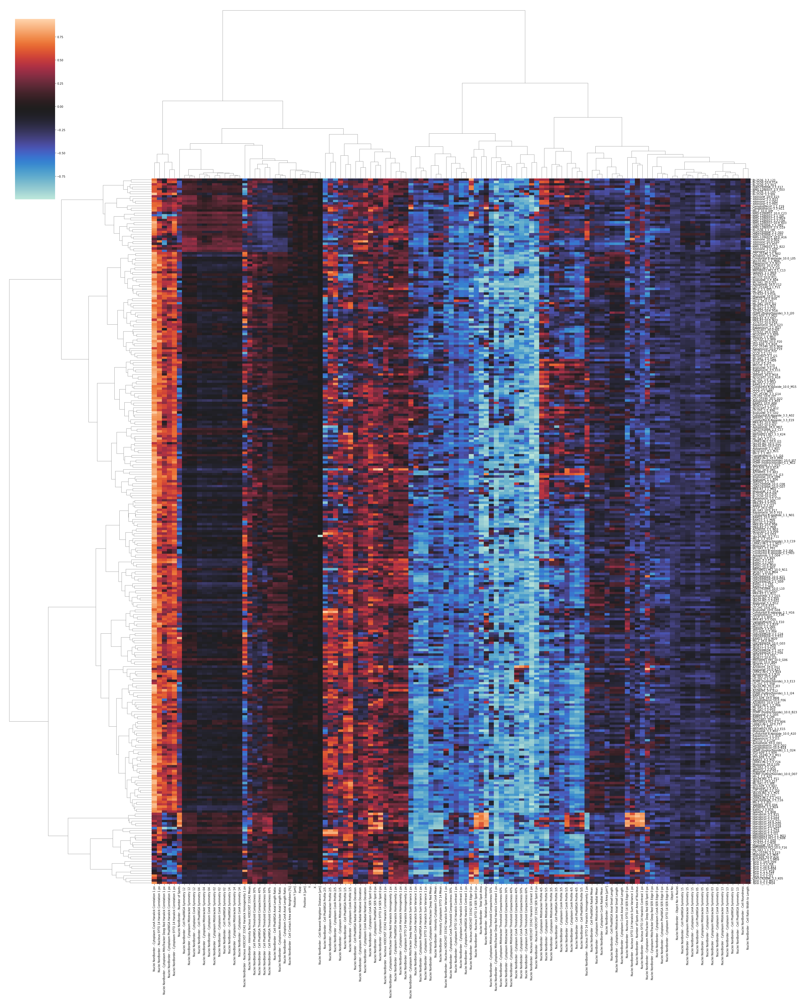

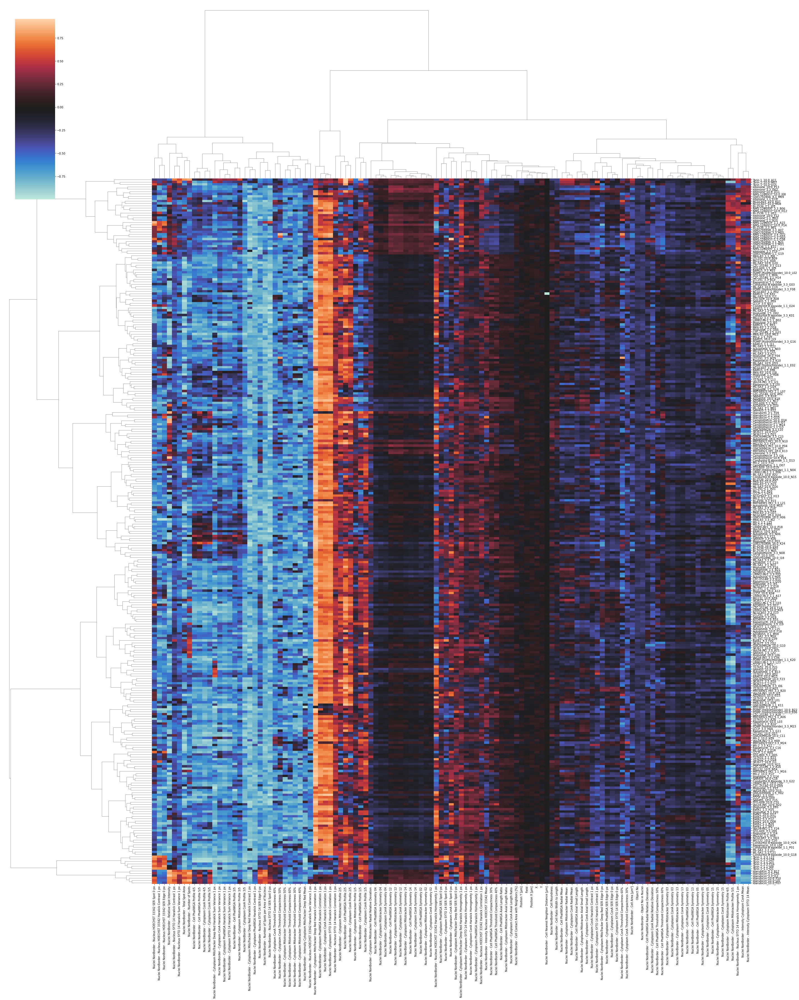

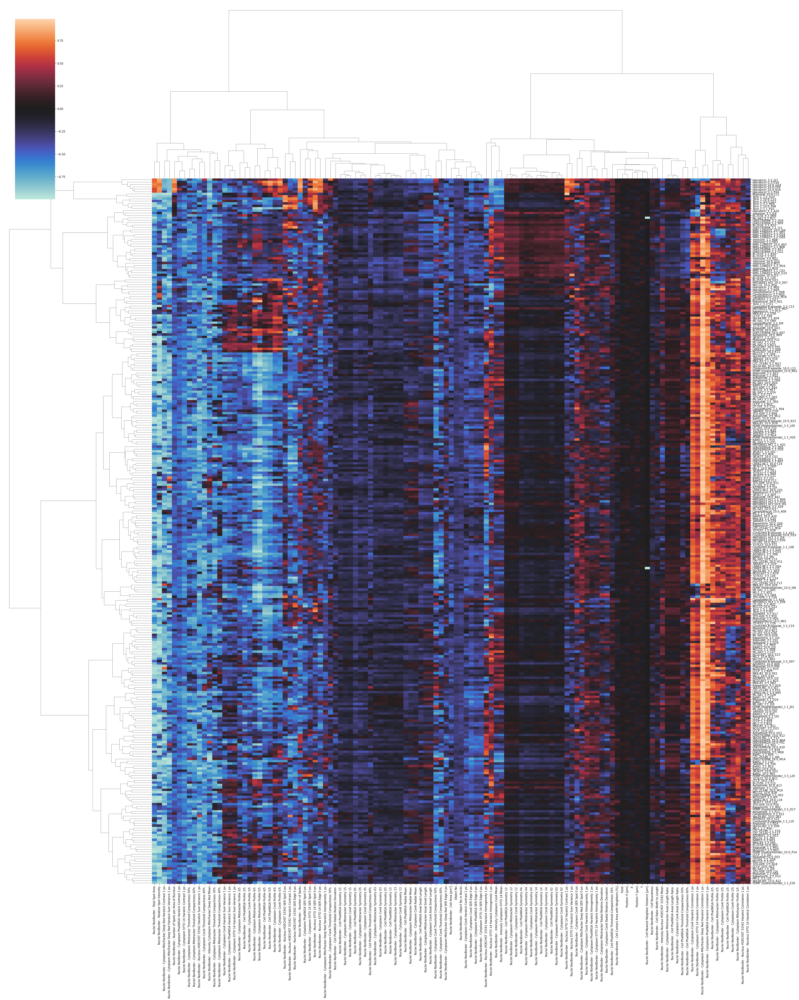

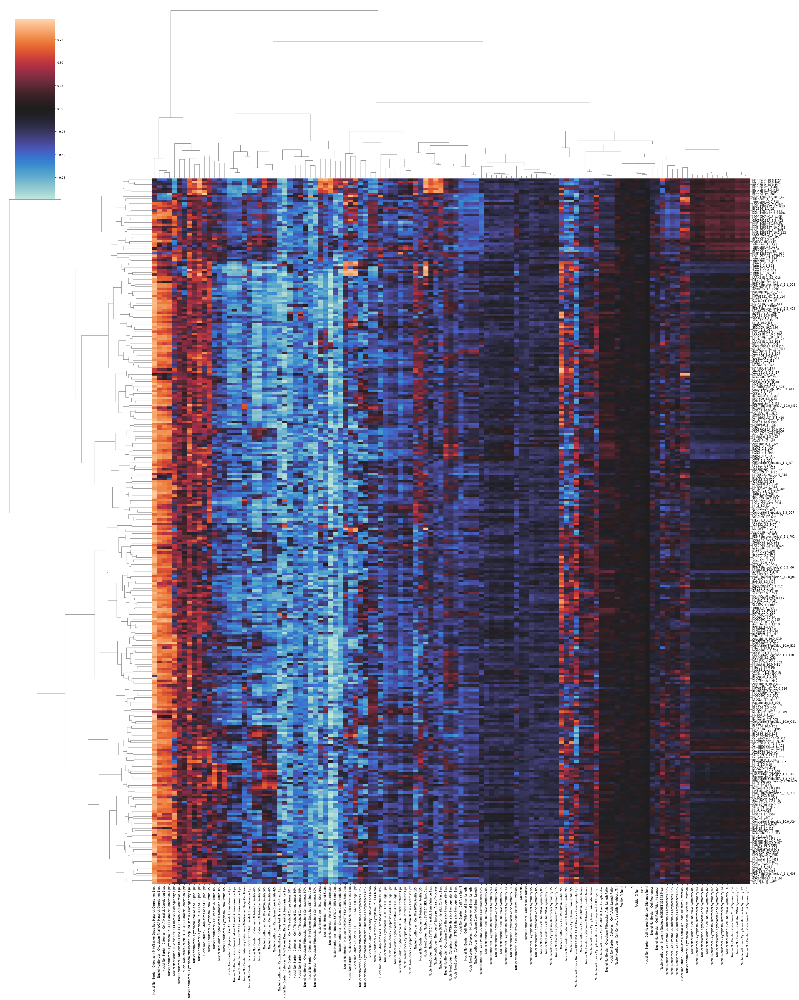

In [58]:
clustermap_list = []
for i in range(len(file_path_match)):
    cluster = sns.clustermap(with_labels[i], method = 'ward', metric = 'euclidean', cmap="icefire",  xticklabels=1, yticklabels=1, figsize = (40,50) )
    clustermap_list.append(cluster)
print("These are all the clustermaps for the treatments on plates 1 to " + str(len(file_path_match)) + " *without* any features dropped")
clustermap_list[0]

In [59]:
labeled_corr_list = []
for i in range(len(file_path_match)):
    c = with_labels[i].corr()
    c = c.dropna(axis = 1, how = 'all')
    c = c.dropna(axis = 0, how = 'all')
    labeled_corr_list.append(c)

,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
Field,1.000000,-0.338206,0.045642,0.025544,0.593454,-0.176305,-0.266139,-0.097842,-0.000912,0.013474,...,-0.092007,0.010041,-0.071475,-0.113420,-0.021082,0.095570,-0.064725,-0.032112,0.015331,-0.007842
Object No,-0.338206,1.000000,-0.019068,0.065934,-0.322181,0.026456,0.786763,0.120803,-0.073964,-0.000327,...,0.064749,0.166620,0.114917,0.090723,0.094482,-0.113555,-0.007512,-0.012018,-0.021417,0.012322
X,0.045642,-0.019068,1.000000,0.044698,0.289433,-0.005102,0.007012,-0.001857,0.042632,0.055927,...,0.025169,0.022312,0.018719,-0.037616,-0.073896,-0.120896,0.003566,0.091629,0.030437,-0.027714
Y,0.025544,0.065934,0.044698,1.000000,-0.003150,-0.382758,0.097012,0.034026,0.069851,-0.010350,...,0.132821,0.022622,-0.005175,0.001000,-0.057275,-0.036481,-0.005090,0.179252,0.010113,-0.014707
Position X [µm],0.593454,-0.322181,0.289433,-0.003150,1.000000,-0.212390,-0.203079,-0.170110,0.046789,0.061304,...,-0.014897,-0.026440,-0.120299,-0.217135,-0.040977,0.050296,-0.074953,0.012356,0.093762,0.077477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Nuclei NonBorder - Cytoplasm ConA Profile 1/5,0.095570,-0.113555,-0.120896,-0.036481,0.050296,-0.020230,-0.077056,-0.075347,-0.021515,-0.026643,...,-0.032755,-0.028337,0.077742,-0.047540,-0.028782,1.000000,-0.079060,-0.396505,-0.243219,-0.122145
Nuclei NonBorder - Cytoplasm ConA Profile 2/5,-0.064725,-0.007512,0.003566,-0.005090,-0.074953,0.038925,-0.005685,0.055217,-0.070465,0.007527,...,-0.069685,0.033567,0.192131,0.081699,-0.007206,-0.079060,1.000000,-0.122365,-0.143654,-0.110075
Nuclei NonBorder - Cytoplasm ConA Profile 3/5,-0.032112,-0.012018,0.091629,0.179252,0.012356,-0.034970,-0.044917,0.059024,0.010785,0.013824,...,0.010535,0.093347,-0.000189,0.049416,0.058980,-0.396505,-0.122365,1.000000,0.621157,0.467921
Nuclei NonBorder - Cytoplasm ConA Profile 4/5,0.015331,-0.021417,0.030437,0.010113,0.093762,-0.047004,-0.049585,-0.012341,0.095959,0.100114,...,-0.041620,-0.074722,-0.163607,-0.043274,0.006113,-0.243219,-0.143654,0.621157,1.000000,0.896050


<AxesSubplot:>

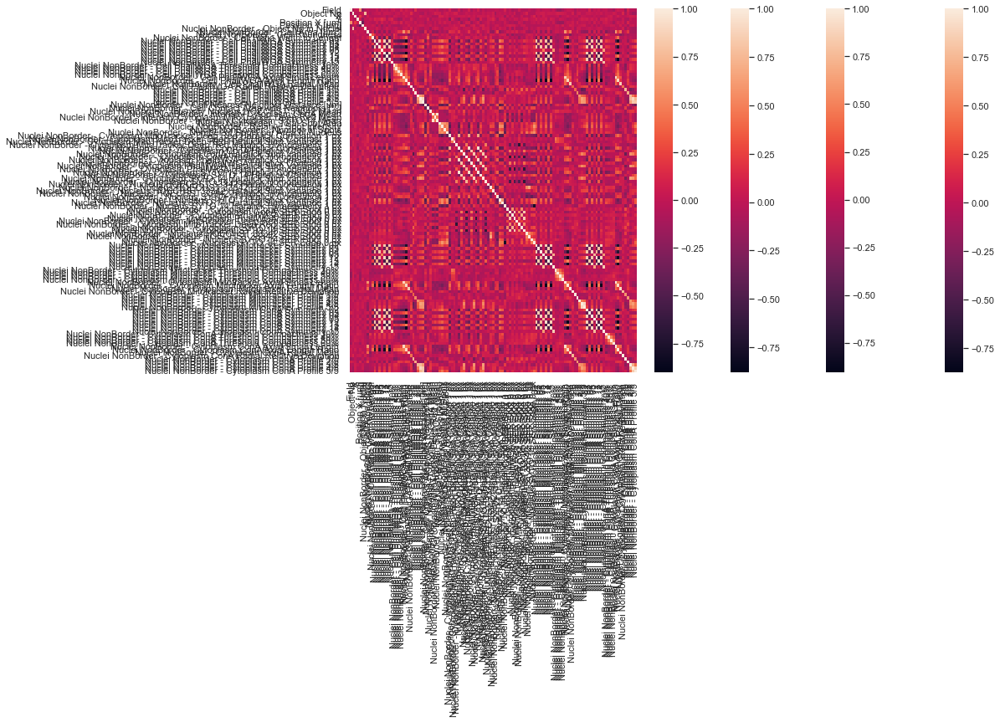

In [142]:
heatmap_list = []
for i in range(len(labeled_corr_list)):
    sns.set(rc = {'figure.figsize':(15,8)})
    hmap = sns.heatmap(labeled_corr_list[i], xticklabels=labeled_corr_list[i].columns, yticklabels=labeled_corr_list[i].columns)
    heatmap_list.append(hmap)
#heatmap_list[0]

In [60]:
# sub-sampled ctrl for the ctrl ks statistics 
ctrl_faux_list = []
for i in range(len(file_path_match)):
    ctrl_faux = []
    for j in range(len(ks_df_list[i]['D'].tolist())):
        sample = ctrl_df_numerical_list[i].sample(frac = .3)
        ctrl_faux.append(sample)
    ctrl_faux_list.append(ctrl_faux)

,Plane,Timepoint,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
8394,1,0,4,52,306,448,499.24,-593.84,68,1578.800,...,0.468933,27.4911,0.755207,29.2226,0.467296,0.857636,1.08470,1.42329,1.95983,2.30703
43243,1,0,1,2,277,124,-162.44,242.38,4,938.680,...,0.430178,10.2886,0.221003,27.8678,0.680802,0.791896,1.22357,1.67567,2.50835,3.03967
58752,1,0,2,52,347,968,-770.42,391.55,70,2530.750,...,0.354601,26.8538,0.505570,36.2500,0.589821,0.736440,1.19657,1.51840,1.95273,2.37390
40243,1,0,2,3,726,318,-532.23,782.02,7,1474.150,...,0.459039,15.6250,0.286662,33.4457,0.661131,0.802438,1.14066,1.68295,2.55115,3.20961
3282,1,0,3,13,313,866,498.03,448.25,21,2289.530,...,0.487218,20.6090,0.302938,43.9553,0.554649,0.790583,1.12077,1.72062,2.11684,2.58130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14765,1,0,4,47,723,665,765.22,-725.95,66,2814.610,...,0.439273,16.8978,0.229884,46.9116,0.540802,0.699248,1.12893,1.61690,2.44954,3.07842
20317,1,0,2,44,330,940,-769.75,409.26,69,2046.890,...,0.369499,31.6986,0.859321,30.6164,0.511659,0.764786,1.04440,2.08677,2.48073,3.02092
34386,1,0,1,23,707,430,77.42,65.91,42,4659.710,...,0.388552,20.5974,0.231300,57.4816,0.514019,0.613712,1.13674,1.71724,2.42264,3.31444
15642,1,0,1,5,731,782,122.84,-151.61,15,865.923,...,0.486214,11.0250,0.305721,22.7025,0.616066,0.747010,1.30773,1.39858,1.88261,2.24395


In [62]:
# making histogram for each sub-sampled ks 
ctrl_cdf_dict = {}
for i in range(len(file_path_match)):
    faux_col_names = [col for col in ctrl_faux_list[i][0]]
    for j in range(len(ctrl_faux_list[i])):
        cdf_list = []
        #print(cmd)
        for faux_column_name in faux_col_names:
                count_trt_vec1, bins_count_trt_vec1 = np.histogram(ctrl_faux_list[i][j][faux_column_name], bins = 100)
                pdf_test1 = count_trt_vec1/sum(count_trt_vec1)
                cdf_test1 = np.cumsum(pdf_test1)
                cdf_list.append(cdf_test1)
                exec('ctrl_cdf_dict[i,j] = cdf_list')

In [65]:
ctrl_cdf_list_perplate = []
for i in range(len(file_path_match)):
    ctrl_cdf_list = []
    for j in range(len(ctrl_df_numerical_list[i].columns)):
        count_ctrl_p1, bins_count_ctrl_p1 = np.histogram(ctrl_df_numerical_list[i].iloc[:,j], bins = 100)
        pdf_ctrl_p1 = count_ctrl_p1/sum(count_ctrl_p1)                                                            
        cdf_ctrl_p1 = np.cumsum(pdf_ctrl_p1)
        ctrl_cdf_list.append(cdf_ctrl_p1)
    ctrl_cdf_list_perplate.append(ctrl_cdf_list)

100

In [66]:
ks_ctrl_per_plate = []
for i in range(len(file_path_match)):
    ks_faux = []
    for j in range(len(ctrl_faux_list[i])):
        for k in range(len(ctrl_faux_list[i][j].columns)):
                edf = abs(ctrl_cdf_dict[i,j][k] - ctrl_cdf_list_perplate[i][k])
                diff = ctrl_cdf_dict[i,j][k] - ctrl_cdf_list_perplate[i][k]
                argmax = np.argmax(edf)
                ks_stat = diff[argmax]
                ks_faux.append(ks_stat)
    ks_ctrl_per_plate.append(ks_faux)

In [67]:
def chunker(seq, size):
    return (seq[pos:pos + size] for pos in range(0, len(seq), size))

In [68]:
chunked = []
for i in range(len(file_path_match)):
    groups_faux_ctrl = []
    for group in chunker(ks_ctrl_per_plate[i], len(ctrl_faux_list[i][0].columns)):
        groups_faux_ctrl.append(group)
    chunked.append(groups_faux_ctrl)

In [70]:
faux_ctrl_ks_df_list = []
for i in range(len(file_path_match)):
    ks_ctrl_faux_df = pd.DataFrame(chunked[i], columns=ctrl_faux_list[i][0].columns)
    ks_ctrl_faux_df = ks_ctrl_faux_df.drop(["Plane", "Timepoint"], axis = 1)
    faux_ctrl_ks_df_list.append(ks_ctrl_faux_df)

,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
0,0.005351,0.010148,0.011514,-0.006108,0.014112,-0.005112,0.009254,-0.018289,-0.030150,-0.004991,...,-0.625612,-0.008568,-0.014032,-0.220301,-0.122776,-0.253276,0.580790,0.042569,-0.135976,0.087386
1,0.006459,0.007482,0.014739,0.016190,-0.006176,0.007071,-0.007535,0.057756,-0.051486,0.013077,...,0.013301,0.025582,-0.017340,0.073284,0.345957,-0.174287,0.568144,-0.085084,-0.317430,-0.093147
2,-0.009240,-0.008035,0.013411,0.011593,-0.010856,0.005835,-0.011197,-0.042600,-0.020116,-0.020362,...,-0.659075,-0.011221,0.012444,-0.034207,-0.017720,-0.172926,0.357087,-0.122956,-0.125601,0.009909
3,-0.005466,-0.021297,-0.011494,0.010304,0.011568,0.010377,-0.032403,-0.039004,-0.016326,0.019777,...,0.010773,0.022096,0.020554,0.109885,-0.059731,-0.241723,-0.029811,0.227428,-0.090193,0.035464
4,0.006402,-0.012467,0.012648,0.011019,-0.006516,-0.006402,-0.012490,-0.023554,0.014847,-0.057390,...,-0.548176,0.034184,-0.008811,0.048187,-0.137172,0.223191,-0.161450,-0.365775,-0.308675,-0.180112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,-0.007489,-0.042951,0.016071,-0.009375,-0.008675,0.007655,-0.051608,0.019877,0.057329,0.010446,...,-0.412379,0.029012,-0.007234,-0.071827,-0.006460,-0.070280,0.426623,0.244743,0.008587,0.033627
293,0.008405,0.005812,0.007157,0.016466,0.008020,0.013365,0.006456,-0.075411,-0.116074,-0.114720,...,0.028808,-0.078454,0.033915,-0.116113,-0.052218,-0.212614,0.377207,-0.052572,-0.199060,-0.208711
294,-0.005992,-0.024482,-0.009235,0.016141,-0.006681,-0.009670,-0.019032,0.046405,0.061627,-0.023149,...,-0.544285,0.047884,0.006190,-0.034263,0.438406,-0.099700,0.373818,-0.208966,-0.319570,-0.264937
295,-0.008267,-0.023341,0.008627,-0.011053,-0.010057,0.010094,-0.016058,-0.053126,-0.025996,-0.055509,...,-0.629114,0.044187,-0.017307,0.056680,-0.158184,0.065884,0.484795,-0.343402,-0.448387,-0.393753


C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


These are all the clustermaps for the sub-sampled control from plates 1 to 4 *without* any features dropped


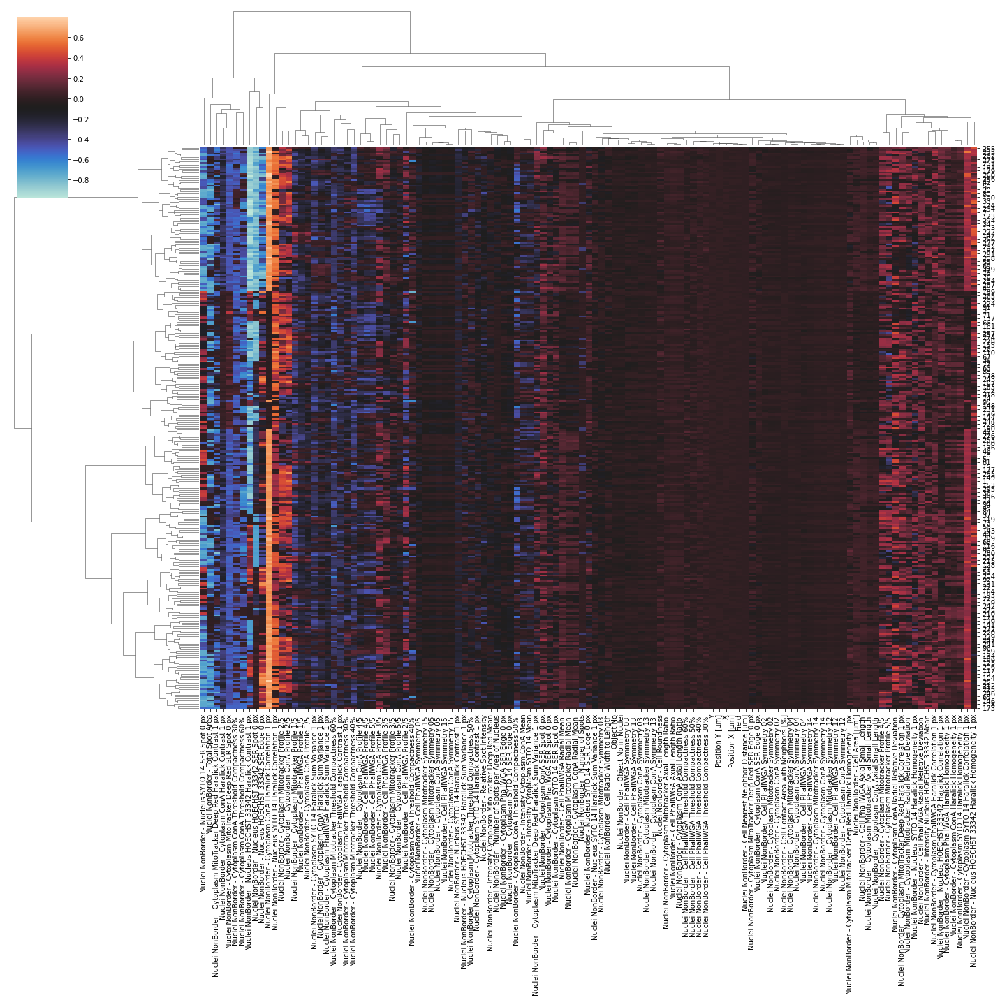

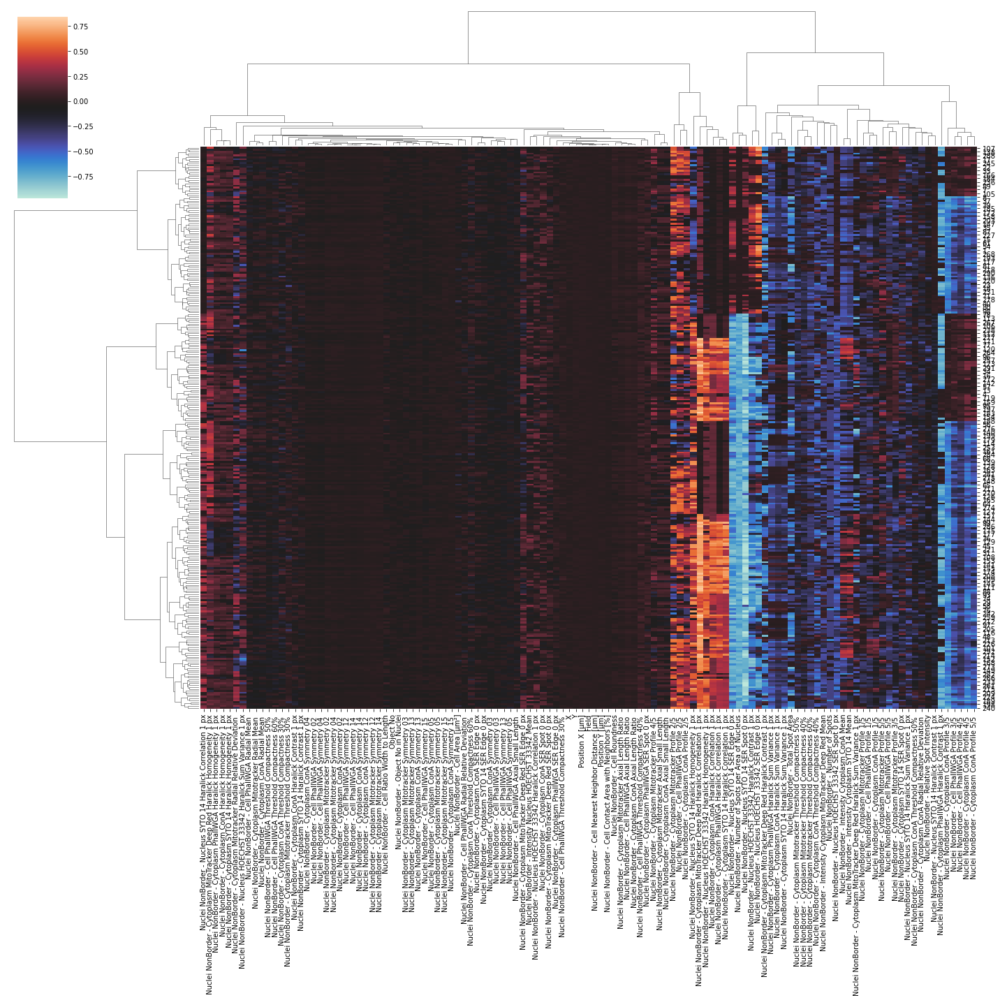

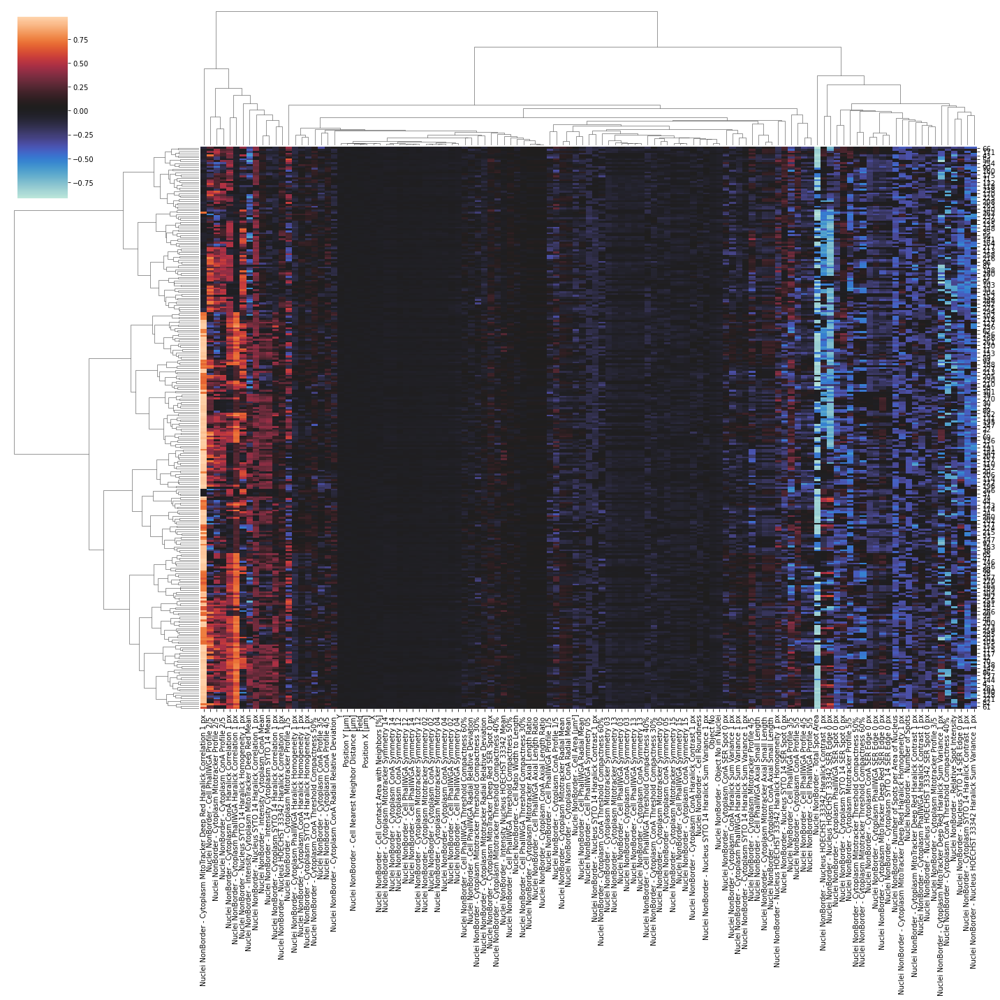

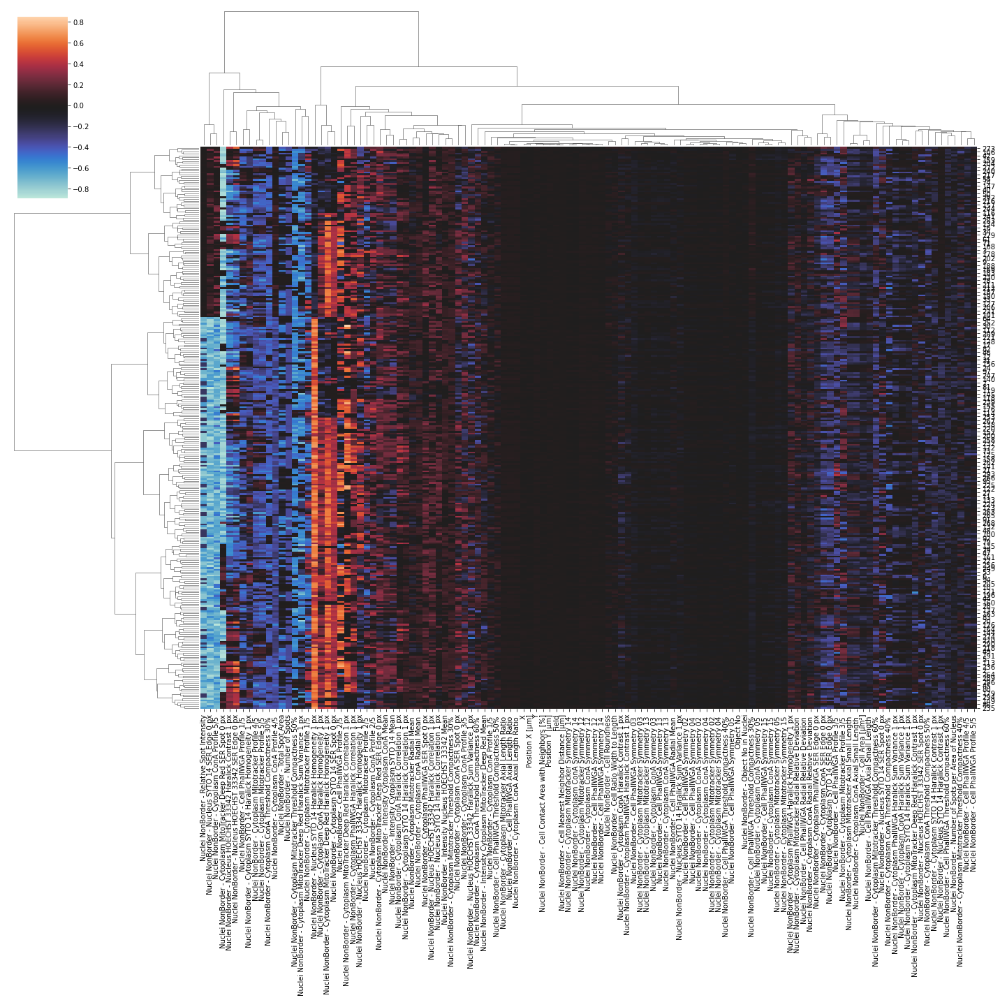

In [71]:
ctrl_clustermap_list = []
for i in range(len(file_path_match)):
    ctrl_cluster = sns.clustermap(faux_ctrl_ks_df_list[i], method = 'ward', metric = 'euclidean', cmap="icefire",  xticklabels=1, yticklabels=2, figsize = (20,20))
    ctrl_clustermap_list.append(ctrl_cluster)
print("These are all the clustermaps for the sub-sampled control from plates 1 to " + str(len(file_path_match)) + " *without* any features dropped")
ctrl_clustermap_list

In [147]:
# ask if makes sense to ask about setting correlation for these
where = input("Where would you like the correlated and/or non-varied features to be deposited? Please copy the name of that file path and put a \ at the end of it")
name = input("What would you like it to be called? Please put the name.txt WITHOUT spaces")
correlation = input("Please input the correlation value greater or equal to which you would like to see between features.\n\nFor example, a value of .9 would look at features that are more than 90% correlated with one another, and list them.\n\n")
corr_list = []
for i in range(len(file_path_match)):
    upper1 = labeled_corr_list[i].where(np.triu(np.ones(labeled_corr_list[i].shape), k=1).astype(bool))
    to_drop1 = [column for column in upper1.columns if any(upper1[column] >= float(correlation))]
    corr_list.append(to_drop1)
for i in range(len(file_path_match)):
    with open( str(where + name), "a") as o:
        o.write("\nFor plate " + str(i + 1) + " the following features are more than " + str(correlation) + " correlated: \n\n" + str(corr_list[i]) +".\n\nThere are exactly " + str(len(corr_list[i])) + " of them.")

Where would you like the correlated and/or non-varied features to be deposited? Please copy the name of that file pathC:\Users\jrozenblit\Box\jrozenblit\
What would you like it to be called? Please put the name.txt WITHOUT spacesattempting
Please input the correlation value greater or equal to which you would like to see between features.

For example, a value of .9 would look at features that are more than 90% correlated with one another, and list them.

.9


In [146]:
# -------- here we say "do you want to drop the least varied features? Set threshold between .001 and .005 (1 to 5 percent)"
variance = input("Please input the variance value less than or equal to which you would like to see within ONE feature.\n\nFor example, a value of .05 would look for features that vary less than 5% between all wells. It is reccomended to the user to stay between .01 (1%) and *at most* .05 (5%) so as not to accidentally eliminate any relavant data.\n\n")
var_list = []
for i in range(len(file_path_match)):
    variation = with_labels[i].var()
    variable = [ ]
    cola = with_labels[i].columns
    for i in range(len(variation)):
        if variation[i] <= float(variance): #setting the threshold as 5%
            variable.append(cola[i])
    var_list.append(variable)
for i in range(len(file_path_match)):
    with open(str(where + name), "a") as o:
        o.write("\nFor plate " + str(i + 1) + " you are dropping features: \n\n" + str(var_list[i]) +".\n\nThere are exactly " + str(len(var_list[i])) + " of them.")

Please input the variance value less than or equal to which you would like to see within ONE feature.

For example, a value of .05 would look for features that vary less than 5% between all wells. It is reccomended to the user to stay between .01 (1%) and *at most* .05 (5%) so as not to accidentally eliminate any relavant data.

.01


In [74]:
dropboth_list = []
for i in range(len(file_path_match)):
    l = set(corr_list[i]) | set(var_list[i])
    dropboth_list.append(l)
len(dropboth_list[0])

34

In [75]:
confirm = input("Would you like to drop \n(1)Both highly correlated and low variance features from your dataset\n(2) Only highly correlated features from your dataset\n(3) Only low variance features from your dataset\n(4) NO features from your dataset.\nPlease only type the number corresponding to ONE of these options.\n You will have the option to try again once if a mistake is made.\\n It is recommended that you drop both, as these are features that cause noise in the data.\n\nPlease enter your number below:\n")

# ---- if both are yes;
if confirm == '1':
    drop_both = []
    for i in range(len(file_path_match)):
        h = with_labels[i].drop(dropboth_list[i], axis = 1)
        drop_both.append(h)
# -- if only first input is yes:
if confirm == '2':
    drop_corr = []
    for i in range(len(file_path_match)):
        h = with_labels[i].drop(corr_list[i], axis = 1)
        drop_corr.append(h)
# --- if pnly second input is yes:
if confirm == '3':
    drop_var = []
    for i in range(len(file_path_match)):
        h = with_labels[i].drop(var_list[i], axis = 1)
        drop_var.append(h)
if confirm == '4':
    print("You have chosen not to drop any features from all plates in this experiment.")

if (confirm != '1') & (confirm != '2') & (confirm != '3') & (confirm != '4'):
    oops = input("Oops, your input was invalid. Would you like to try again, or not drop any features? Press Y to try again, and press N to not drop any feautres ")
    if oops == 'Y':
        confirm = input("Below you will be presented to drop \n(1)Both highly correlated and low variance features from your dataset\n(2) Only highly correlated features from your dataset\n(3) Only low variance features from your dataset\n (4) NO features from your dataset.\nPlease only type the number corresponding to ONE of these options.\n\nYou will have the option to try again once if a mistake is made (i.e. if N is entered for all features, or if a invalid number is entered).\n\nPress ENTER to continue ")
        if confirm == '1':
            drop_both = []
            for i in range(len(file_path_match)):
                h = with_labels[i].drop(dropboth_list[i], axis = 1)
                drop_both.append(h)
        # -- if only first input is yes:
        if confirm == '2':
            drop_corr = []
            for i in range(len(file_path_match)):
                h = with_labels[i].drop(corr_list[i], axis = 1)
                drop_corr.append(h)
        # --- if pnly second input is yes:
        if confirm == '3':
            drop_var = []
            for i in range(len(file_path_match)):
                h = with_labels[i].drop(var_list[i], axis = 1)
                drop_var.append(h)
        if confirm == '4':
            print("You have chosen not to drop any features from all plates in this experiment.")


Would you like to drop 
(1)Both highly correlated and low variance features from your dataset
(2) Only highly correlated features from your dataset
(3) Only low variance features from your dataset
(4) NO features from your dataset.
Please only type the number corresponding to ONE of these options.

You will have the option to try again once if a mistake is made.\n It is recommended that you drop both, as these are features that cause noise in the data.

Please enter your number below:
1


In [76]:
drop_both[0]

,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,Nuclei NonBorder - Cell PhallWGA Symmetry 02,Nuclei NonBorder - Cell PhallWGA Symmetry 04,Nuclei NonBorder - Cell PhallWGA Symmetry 12,Nuclei NonBorder - Cell PhallWGA Symmetry 14,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 30%,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 40%,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 50%,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 30%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 40%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 50%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
MK6-83_10.0_A01,0.154199,-0.202672,-0.176369,-0.213442,-0.172237,-0.088140,-0.119734,-0.127422,-0.108128,0.109932,...,-0.500455,-0.850662,-0.888902,-0.881926,0.337329,-0.209375,-0.247914,0.205776,-0.165034,0.090073
Conduritol B epoxide_10.0_A10,-0.354278,-0.217408,-0.157513,-0.134156,-0.119652,-0.104578,-0.102849,0.111113,-0.094541,-0.116929,...,-0.471008,-0.758854,-0.848543,-0.785473,0.463276,0.335517,0.345255,-0.403297,-0.598753,-0.471551
Camptothecin_3.3_A11,-0.102038,-0.199597,-0.251443,0.160842,0.145962,0.122217,0.094353,-0.153689,-0.174613,-0.208136,...,-0.433849,-0.511286,-0.772199,-0.661651,0.179554,0.457850,0.408890,-0.319451,-0.275454,-0.138685
NCGC607_3.3_A12,0.181327,-0.273940,-0.266341,-0.179558,-0.189388,-0.106504,-0.169716,0.109743,-0.081655,0.121458,...,-0.628241,-0.742254,-0.457149,-0.641549,-0.161416,-0.218722,0.257699,0.496256,0.343116,0.328919
Rapamycin_1.1_A14,-0.153723,-0.276370,-0.233579,-0.162584,-0.168758,-0.103272,-0.099170,-0.172951,-0.171280,-0.232662,...,-0.660811,-0.506028,-0.619665,-0.674505,0.564571,0.444666,0.203417,-0.650375,-0.863916,-0.654527
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ML-SA3_10.0_I03,-0.131028,-0.104071,-0.174126,-0.175081,-0.178340,-0.107669,-0.115556,0.091729,0.060729,-0.063272,...,-0.564169,-0.772852,-0.783377,-0.817544,0.268080,-0.206651,0.471966,0.153104,-0.348560,-0.419094
SAR405_1.1_I04,-0.090622,-0.178020,-0.155728,-0.128000,-0.153822,-0.080743,-0.103269,0.170828,0.102885,0.096019,...,-0.561452,-0.786616,-0.873183,-0.836269,0.342637,-0.222921,-0.231313,0.152845,-0.243829,-0.293165
NCGC607_10.0_I05,-0.074644,-0.257881,-0.257342,-0.075192,-0.101241,0.067167,0.045278,-0.137158,-0.121409,-0.119644,...,-0.635381,-0.764046,0.200717,-0.573528,-0.131909,0.601923,-0.213785,-0.386540,-0.600918,-0.618205
rotenone_1.1_I08,-0.311790,-0.168795,-0.179797,0.264894,0.218998,0.336192,0.263118,-0.303219,-0.316299,-0.289582,...,-0.633012,-0.672346,-0.595364,-0.725390,0.343617,-0.299530,-0.329834,-0.224656,-0.287199,-0.178161


In [77]:
centroid_array_list = []
for i in range(len(file_path_match)):
    k = faux_ctrl_ks_df_list[i].mean()
    centroid_array_list.append(k)
centroid_array_list[0]

Field                                            -0.000124
Object No                                        -0.027322
X                                                 0.002877
Y                                                 0.002318
Position X [µm]                                  -0.000718
                                                    ...   
Nuclei NonBorder - Cytoplasm ConA Profile 1/5    -0.096112
Nuclei NonBorder - Cytoplasm ConA Profile 2/5     0.181458
Nuclei NonBorder - Cytoplasm ConA Profile 3/5     0.004046
Nuclei NonBorder - Cytoplasm ConA Profile 4/5    -0.146144
Nuclei NonBorder - Cytoplasm ConA Profile 5/5    -0.057292
Length: 119, dtype: float64

In [78]:
with_labels[1]

,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
BI-2536_10.0_A01,0.112677,-0.230393,0.041190,0.109736,0.112677,-0.081964,-0.223501,-0.268385,-0.106210,-0.160761,...,0.238724,-0.238806,0.142076,0.118461,-0.267535,0.378775,0.239338,-0.579589,-0.578694,-0.584746
Mli-2_3.3_A10,0.061804,-0.302746,0.056762,-0.036638,0.091581,0.065093,-0.314962,-0.256670,-0.102926,-0.233963,...,-0.427577,-0.100915,-0.074439,-0.157339,-0.341358,-0.164624,0.093412,-0.543211,-0.469619,-0.616135
Torin 1_10.0_A11,-0.258733,-0.233747,0.093148,0.148357,-0.258733,-0.402337,-0.208772,0.506933,-0.339555,-0.332486,...,-0.341179,0.234399,-0.254219,0.496388,-0.172194,-0.415689,0.669920,-0.204361,-0.234818,0.188190
Miglustat_10.0_A12,0.062341,-0.203973,0.067931,0.057867,0.065346,-0.087636,-0.192948,-0.304426,0.073519,0.035625,...,-0.500278,-0.251803,0.045278,-0.242983,-0.375199,0.578096,0.514748,-0.578081,-0.253886,-0.177162
NMS-1286937_1.1_A15,0.063936,-0.283642,-0.058257,0.051846,-0.071991,-0.087924,-0.277674,-0.298458,-0.060283,0.138838,...,-0.080994,-0.261185,-0.156765,-0.394675,-0.202893,0.367248,-0.309495,-0.524299,-0.408084,-0.371551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Miglustat_3.3_I03,0.013435,-0.335157,0.070429,-0.091282,0.025725,-0.036100,-0.341288,-0.209272,-0.079604,-0.257973,...,0.097385,-0.172970,-0.109511,-0.054042,-0.211671,-0.331363,0.527592,-0.703228,-0.817894,-0.681220
GSK269962A_3.3_I06,0.060083,-0.240339,-0.072721,0.062901,-0.123907,0.047645,-0.190830,-0.162460,0.202061,0.139696,...,-0.576687,-0.193144,0.111844,-0.172788,-0.461936,0.385993,0.635556,-0.879061,-0.577179,-0.490956
Camptothecin_10.0_I07,0.085676,-0.225916,0.063527,-0.066445,0.104640,-0.107240,-0.212356,0.088081,0.284213,0.204056,...,-0.221957,-0.155208,-0.071395,-0.245381,-0.397654,-0.126556,0.819995,-0.589526,-0.567504,-0.334597
NMS-1286937_10.0_I08,-0.087489,-0.257985,-0.065537,0.167084,-0.085284,-0.120174,-0.278780,-0.232061,-0.351295,-0.137876,...,-0.561078,0.232084,-0.152205,0.170965,-0.647621,-0.283269,0.301781,-0.634081,-0.496684,-0.485535


In [79]:
faux_ctrl_ks_df_list[0]

,Field,Object No,X,Y,Position X [µm],Position Y [µm],Nuclei NonBorder - Object No in Nuclei,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Axial Small Length,Nuclei NonBorder - Cytoplasm ConA Axial Length Ratio,Nuclei NonBorder - Cytoplasm ConA Radial Mean,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
0,0.005351,0.010148,0.011514,-0.006108,0.014112,-0.005112,0.009254,-0.018289,-0.030150,-0.004991,...,-0.625612,-0.008568,-0.014032,-0.220301,-0.122776,-0.253276,0.580790,0.042569,-0.135976,0.087386
1,0.006459,0.007482,0.014739,0.016190,-0.006176,0.007071,-0.007535,0.057756,-0.051486,0.013077,...,0.013301,0.025582,-0.017340,0.073284,0.345957,-0.174287,0.568144,-0.085084,-0.317430,-0.093147
2,-0.009240,-0.008035,0.013411,0.011593,-0.010856,0.005835,-0.011197,-0.042600,-0.020116,-0.020362,...,-0.659075,-0.011221,0.012444,-0.034207,-0.017720,-0.172926,0.357087,-0.122956,-0.125601,0.009909
3,-0.005466,-0.021297,-0.011494,0.010304,0.011568,0.010377,-0.032403,-0.039004,-0.016326,0.019777,...,0.010773,0.022096,0.020554,0.109885,-0.059731,-0.241723,-0.029811,0.227428,-0.090193,0.035464
4,0.006402,-0.012467,0.012648,0.011019,-0.006516,-0.006402,-0.012490,-0.023554,0.014847,-0.057390,...,-0.548176,0.034184,-0.008811,0.048187,-0.137172,0.223191,-0.161450,-0.365775,-0.308675,-0.180112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,-0.007489,-0.042951,0.016071,-0.009375,-0.008675,0.007655,-0.051608,0.019877,0.057329,0.010446,...,-0.412379,0.029012,-0.007234,-0.071827,-0.006460,-0.070280,0.426623,0.244743,0.008587,0.033627
293,0.008405,0.005812,0.007157,0.016466,0.008020,0.013365,0.006456,-0.075411,-0.116074,-0.114720,...,0.028808,-0.078454,0.033915,-0.116113,-0.052218,-0.212614,0.377207,-0.052572,-0.199060,-0.208711
294,-0.005992,-0.024482,-0.009235,0.016141,-0.006681,-0.009670,-0.019032,0.046405,0.061627,-0.023149,...,-0.544285,0.047884,0.006190,-0.034263,0.438406,-0.099700,0.373818,-0.208966,-0.319570,-0.264937
295,-0.008267,-0.023341,0.008627,-0.011053,-0.010057,0.010094,-0.016058,-0.053126,-0.025996,-0.055509,...,-0.629114,0.044187,-0.017307,0.056680,-0.158184,0.065884,0.484795,-0.343402,-0.448387,-0.393753


In [80]:
distance_list = []
for i in range(len(file_path_match)):
    dist_from_mean_list = []
    for j in range(len(with_labels[i])):
        dist = np.array(with_labels[i].iloc[j,:] - centroid_array_list[i])
        dist_from_mean_list.append(dist)
    distance_list.append(dist_from_mean_list)

In [81]:
distance_ctrl_list = []
for i in range(len(file_path_match)):
    dist_from_mean_list = []
    for j in range(len(faux_ctrl_ks_df_list[i])):
        dist = np.array(faux_ctrl_ks_df_list[i].iloc[j,:] - centroid_array_list[i])
        dist_from_mean_list.append(dist)
    distance_ctrl_list.append(dist_from_mean_list)
len(distance_ctrl_list[0])

297

In [82]:
invcov_mtrx_list = []
for i in range(len(file_path_match)):
    cov = with_labels[i].cov()
    cov = linalg.inv(cov)
    invcov_mtrx_list.append(cov)
invcov_mtrx_ctrl_list = []
for i in range(len(file_path_match)):
    cov = faux_ctrl_ks_df_list[i].cov()
    cov = linalg.inv(cov)
    invcov_mtrx_ctrl_list.append(cov)
#linalg.inv(with_labels[1].cov())

In [83]:
# invcov_mtrx_ctrl_list[1].shape

(119, 119)

In [84]:
# math.sqrt(distance_list[1][10].T.dot(linalg.inv(with_labels[1].cov()).dot(distance_list[1][10])))

12.687322253384362

In [85]:
mahal_list = []
for i in range(len(file_path_match)):
    mahal_plate = []
    for j in range(len(distance_list[i])):
        mahal_dist = math.sqrt(distance_list[i][j].T.dot(linalg.inv(with_labels[i].cov()).dot(distance_list[i][j])))
        mahal_plate.append(mahal_dist)
    mahal_list.append(mahal_plate)

mahal_ctrl_list = []
for i in range(len(file_path_match)):
    mahal_plate = []
    for j in range(len(distance_ctrl_list[i])):
        mahal_dist = math.sqrt(distance_ctrl_list[i][j].T.dot(linalg.inv(faux_ctrl_ks_df_list[i].cov()).dot(distance_ctrl_list[i][j])))
        mahal_plate.append(mahal_dist)
    mahal_ctrl_list.append(mahal_plate)

In [86]:
mahal_list[0]

[14.571643565782164,
 13.722158805030299,
 14.38800421338878,
 13.896704310440553,
 14.28464138074059,
 15.629412151996107,
 16.189729874050013,
 13.152616263343704,
 15.220983387246433,
 14.448699894740916,
 14.590269851748758,
 13.840255534779958,
 13.717481770588549,
 15.5447306669052,
 14.823915202519618,
 14.2079713535403,
 13.452673775276983,
 15.340975169092777,
 15.336082627750734,
 13.931397113139747,
 13.560949538099429,
 14.203711171023704,
 14.255611780328293,
 14.457644410969992,
 14.946782866285389,
 14.46689682726596,
 16.202307400884266,
 16.80562812419602,
 15.277569504786415,
 14.669958709772722,
 13.528592473526473,
 15.085587391575489,
 15.676578279074286,
 13.937881572645422,
 15.157628487215925,
 15.557703114452565,
 15.61069684144297,
 14.912943582935343,
 14.96433219035782,
 14.927966324899325,
 13.772386006054264,
 13.766358071206826,
 14.50290233970623,
 15.495522751776361,
 16.319613878870324,
 15.786152013639928,
 15.179394178502351,
 15.97297457608501,
 14.

In [88]:
# ---- if both are yes;
if confirm == '1':
    ctrl_drop_both = []
    for i in range(len(file_path_match)):
        h = faux_ctrl_ks_df_list[i].drop(dropboth_list[i], axis = 1)
        ctrl_drop_both.append(h)
ctrl_drop_both[0]
# ------ if first input is yes
if confirm == '2':
    ctrl_drop_corr = []
    for i in range(len(file_path_match)):
        h = faux_ctrl_ks_df_list[i].drop(corr_list[i], axis = 1)
        ctrl_drop_corr.append(h)
# --- if pnly second input is yes:
if confirm == '3':
    ctrl_drop_var = []
    for i in range(len(file_path_match)):
        h = faux_ctrl_ks_df_list[i].drop(var_list[i], axis = 1)
        ctrl_drop_var.append(h)
ctrl_drop_both[0]

,Nuclei NonBorder - Cell Area [µm²],Nuclei NonBorder - Cell Roundness,Nuclei NonBorder - Cell Ratio Width to Length,Nuclei NonBorder - Cell PhallWGA Symmetry 02,Nuclei NonBorder - Cell PhallWGA Symmetry 04,Nuclei NonBorder - Cell PhallWGA Symmetry 12,Nuclei NonBorder - Cell PhallWGA Symmetry 14,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 30%,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 40%,Nuclei NonBorder - Cell PhallWGA Threshold Compactness 50%,...,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 30%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 40%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 50%,Nuclei NonBorder - Cytoplasm ConA Threshold Compactness 60%,Nuclei NonBorder - Cytoplasm ConA Radial Relative Deviation,Nuclei NonBorder - Cytoplasm ConA Profile 1/5,Nuclei NonBorder - Cytoplasm ConA Profile 2/5,Nuclei NonBorder - Cytoplasm ConA Profile 3/5,Nuclei NonBorder - Cytoplasm ConA Profile 4/5,Nuclei NonBorder - Cytoplasm ConA Profile 5/5
0,-0.018289,-0.030150,-0.004991,-0.015512,-0.020157,-0.012360,-0.015248,0.033076,0.006442,-0.016465,...,-0.479422,0.079565,-0.494499,-0.625612,-0.122776,-0.253276,0.580790,0.042569,-0.135976,0.087386
1,0.057756,-0.051486,0.013077,-0.029742,0.016694,0.014093,0.010430,-0.017174,-0.035132,-0.012535,...,-0.340642,-0.066228,-0.231888,0.013301,0.345957,-0.174287,0.568144,-0.085084,-0.317430,-0.093147
2,-0.042600,-0.020116,-0.020362,0.010606,-0.020647,-0.011039,-0.017181,-0.021686,0.022309,-0.014722,...,-0.009125,0.069762,-0.433215,-0.659075,-0.017720,-0.172926,0.357087,-0.122956,-0.125601,0.009909
3,-0.039004,-0.016326,0.019777,-0.009602,-0.047200,-0.022586,-0.029337,-0.017081,0.015923,0.009431,...,-0.446153,-0.180349,-0.010495,0.010773,-0.059731,-0.241723,-0.029811,0.227428,-0.090193,0.035464
4,-0.023554,0.014847,-0.057390,-0.015319,-0.017923,-0.012554,-0.014070,-0.017507,0.009332,-0.036015,...,0.014750,0.071978,-0.288892,-0.548176,-0.137172,0.223191,-0.161450,-0.365775,-0.308675,-0.180112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,0.019877,0.057329,0.010446,-0.064466,-0.042484,-0.012043,-0.019364,0.020517,0.047796,0.028740,...,-0.427671,0.067816,0.041587,-0.412379,-0.006460,-0.070280,0.426623,0.244743,0.008587,0.033627
293,-0.075411,-0.116074,-0.114720,-0.036129,-0.025994,-0.012556,-0.025648,-0.016031,-0.012290,-0.042139,...,-0.423974,-0.040359,-0.515787,0.028808,-0.052218,-0.212614,0.377207,-0.052572,-0.199060,-0.208711
294,0.046405,0.061627,-0.023149,-0.011606,-0.021420,-0.017266,-0.018446,0.029964,-0.012122,0.025433,...,-0.517167,0.007325,-0.510453,-0.544285,0.438406,-0.099700,0.373818,-0.208966,-0.319570,-0.264937
295,-0.053126,-0.025996,-0.055509,0.011836,-0.020447,0.006962,-0.018237,0.011535,0.027889,-0.045328,...,-0.485064,-0.451893,-0.546527,-0.629114,-0.158184,0.065884,0.484795,-0.343402,-0.448387,-0.393753


In [89]:
# -------- if both input is yes:
if confirm == '1':
    centroid_both_list = []
    for i in range(len(file_path_match)):
        k = faux_ctrl_ks_df_list[i].drop(dropboth_list[i], axis = 1)
        k = k.mean()
        centroid_both_list.append(k)
#centroid_both_list[0]

# -------- if only first input is yes:
if confirm == '2':
    centroid_corr_list = []
    for i in range(len(file_path_match)):
        k = faux_ctrl_ks_df_list[i].drop(corr_list[i], axis = 1)
        k = k.mean()
        centroid_corr_list.append(k)
#centroid_corr_list[0]

# -------- if only second input is yes:
if confirm == '3':
    centroid_var_list = []
    for i in range(len(file_path_match)):
        k = faux_ctrl_ks_df_list[i].drop(var_list[i], axis = 1)
        k = k.mean()
        centroid_var_list.append(k)
len(centroid_both_list[0])


85

In [90]:
# ---- if only first is yes:
if confirm == '1':
    distance_list_both = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(drop_both[i])):
            dist = np.array(drop_both[i].iloc[j,:] - centroid_both_list[i])
            dist_from_mean_list.append(dist)
        distance_list_both.append(dist_from_mean_list)
    
# ---- if only first is yes:
if confirm == '2':
    distance_list_corr = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(drop_corr[i])):
            dist = np.array(drop_corr[i].iloc[j,:] - centroid_corr_list[i])
            dist_from_mean_list.append(dist)
        distance_list_corr.append(dist_from_mean_list)

# ---- if only first is yes:
if confirm == '3':
    distance_list_var = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(drop_var[i])):
            dist = np.array(drop_var[i].iloc[j,:] - centroid_var_list[i])
            dist_from_mean_list.append(dist)
        distance_list_var.append(dist_from_mean_list)

In [91]:
# ---- if only first is yes:
if confirm == '1':
    ctrl_distance_list_both = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(ctrl_drop_both[i])):
            dist = np.array(ctrl_drop_both[i].iloc[j,:] - centroid_both_list[i])
            dist_from_mean_list.append(dist)
        ctrl_distance_list_both.append(dist_from_mean_list)
    
# ---- if only first is yes:
if confirm == '2':
    ctrl_distance_list_corr = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(ctrl_drop_corr[i])):
            dist = np.array(ctrl_drop_corr[i].iloc[j,:] - centroid_corr_list[i])
            dist_from_mean_list.append(dist)
        ctrl_distance_list_corr.append(dist_from_mean_list)

# ---- if only first is yes:
if confirm == '3':
    ctrl_distance_list_var = []
    for i in range(len(file_path_match)):
        dist_from_mean_list = []
        for j in range(len(ctrl_drop_var[i])):
            dist = np.array(ctrl_drop_var[i].iloc[j,:] - centroid_var_list[i])
            dist_from_mean_list.append(dist)
        ctrl_distance_list_var.append(dist_from_mean_list)

In [92]:
# --- if both first 
if confirm == '1':
    invcov_mtrx_list_both = []
    for i in range(len(file_path_match)):
        cov = drop_both[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_both.append(cov)

# --- if yes first 
if confirm == '2':
    invcov_mtrx_list_corr = []
    for i in range(len(file_path_match)):
        cov = drop_corr[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_corr.append(cov)

# --- if yes second
if confirm == '3':
    invcov_mtrx_list_var = []
    for i in range(len(file_path_match)):
        cov = drop_var[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_var.append(cov)


In [93]:
# --- if both first 
if confirm == '1':
    ctrl_invcov_mtrx_list_both = []
    for i in range(len(file_path_match)):
        cov = ctrl_drop_both[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_both.append(cov)

# --- if yes first 
if confirm == '2':
    ctrl_invcov_mtrx_list_corr = []
    for i in range(len(file_path_match)):
        cov = ctrl_drop_corr[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_corr.append(cov)

# --- if yes second
if confirm == '3':
    ctrl_invcov_mtrx_list_var = []
    for i in range(len(file_path_match)):
        cov = ctrl_drop_var[i].cov()
        cov = linalg.inv(cov)
        invcov_mtrx_list_var.append(cov)


In [94]:
# ----- if both yes
if confirm == '1':
    mahal_list_both = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(distance_list_both[i])):
            mahal_dist = math.sqrt(distance_list_both[i][j].T.dot(linalg.inv(drop_both[i].cov()).dot(distance_list_both[i][j])))
            #print(mahal_dist)
            mahal_plate.append(mahal_dist)
        mahal_list_both.append(mahal_plate)

# ----- if first yes
if confirm == '2':
    mahal_list_corr = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(distance_list_corr[i])):
            mahal_dist = [math.sqrt(distance_list_corr[i][j].T.dot(linalg.inv(drop_corr[i].cov()).dot(distance_list_corr[i][j])))]
            mahal_plate.append(mahal_dist)
        mahal_list_corr.append(mahal_plate)

# ----- if second yes
if confirm == '3':
    mahal_list_var = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(distance_list_var[i])):
            mahal_dist = [math.sqrt(distance_list_var[i][j].T.dot(linalg.inv(drop_var[i].cov()).dot(distance_list_var[i][j])))]
            mahal_plate.append(mahal_dist)
        mahal_list_var.append(mahal_plate)
np.sort(mahal_list_both[0])

array([ 9.30214111,  9.42631101,  9.5490344 ,  9.5845078 ,  9.70590511,
        9.76552795,  9.80105008,  9.92504567,  9.93791745,  9.9481624 ,
        9.96261829, 10.01904558, 10.10477125, 10.10521112, 10.12861201,
       10.15631087, 10.16991437, 10.21834999, 10.22692675, 10.25436663,
       10.26998993, 10.2758873 , 10.29247735, 10.30077514, 10.31326324,
       10.35648693, 10.36204678, 10.39078946, 10.41895409, 10.42203352,
       10.45680653, 10.46564022, 10.46872646, 10.48252836, 10.49003674,
       10.49715975, 10.51054907, 10.52218245, 10.54410516, 10.55265906,
       10.56748188, 10.59303574, 10.5948956 , 10.60042693, 10.60267352,
       10.60888473, 10.61059391, 10.61618203, 10.62297647, 10.64525678,
       10.65340464, 10.65460852, 10.66864053, 10.68030162, 10.68708562,
       10.70503217, 10.72974778, 10.73609169, 10.74534885, 10.7538534 ,
       10.7560625 , 10.76130504, 10.76332133, 10.77422691, 10.79898254,
       10.80650971, 10.8095773 , 10.81244894, 10.82061313, 10.83

In [96]:
# ----- if both yes
if confirm == '1':
    ctrl_mahal_list_both = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(ctrl_distance_list_both[i])):
            mahal_dist = math.sqrt(ctrl_distance_list_both[i][j].T.dot(linalg.inv(ctrl_drop_both[i].cov()).dot(ctrl_distance_list_both[i][j])))
            #print(mahal_dist)
            mahal_plate.append(mahal_dist)
        ctrl_mahal_list_both.append(mahal_plate)

# ----- if first yes
if confirm == '2':
    ctrl_mahal_list_corr = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(ctrl_distance_list_corr[i])):
            mahal_dist = math.sqrt(ctrl_distance_list_corr[i][j].T.dot(linalg.inv(ctrl_drop_corr[i].cov()).dot(ctrl_distance_list_corr[i][j])))
            mahal_plate.append(mahal_dist)
        ctrl_mahal_list_corr.append(mahal_plate)

# ----- if second yes
if confirm == '3':
    ctrl_mahal_list_var = []
    for i in range(len(file_path_match)):
        mahal_plate = []
        for j in range(len(ctrl_distance_list_var[i])):
            mahal_dist = math.sqrt(ctrl_distance_list_var[i][j].T.dot(linalg.inv(ctrl_drop_var[i].cov()).dot(ctrl_distance_list_var[i][j])))
            mahal_plate.append(mahal_dist)
        ctrl_mahal_list_var.append(mahal_plate)
ctrl_mahal_list_both[0]

[9.830412054675604,
 8.89636656876983,
 9.333739175579117,
 9.356243990498067,
 9.695513652604028,
 9.206646487801184,
 9.040346260233393,
 9.86929556998457,
 8.75863743964624,
 9.899155109624074,
 10.071000027989601,
 8.662697302200844,
 9.154876681216876,
 8.854813502024717,
 9.47324759094724,
 8.980937624398457,
 8.925350485015063,
 8.443306170372681,
 9.571238237927577,
 8.185499097088949,
 8.535422569075601,
 9.635505633374635,
 8.79006196719241,
 9.158358514924055,
 8.690043160764612,
 9.844888453899635,
 9.53261450179125,
 9.130320618054059,
 9.144513427417277,
 9.311678477082689,
 8.427619543200535,
 10.270332016679939,
 9.418671571228995,
 8.834305721702778,
 9.49432186829212,
 9.868297271441707,
 9.455682231940282,
 8.390928247221522,
 11.177114435285123,
 9.074036705378415,
 8.81608891961089,
 8.99997469453754,
 10.303102690643943,
 9.42405725944342,
 8.725449904159229,
 9.693015140233006,
 9.359705026347509,
 9.263545112217251,
 10.472727999160469,
 8.49581411770811,
 9.808

C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
C:\Users\jrozenblit\anaconda3\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


AttributeError: 'list' object has no attribute 'figure'

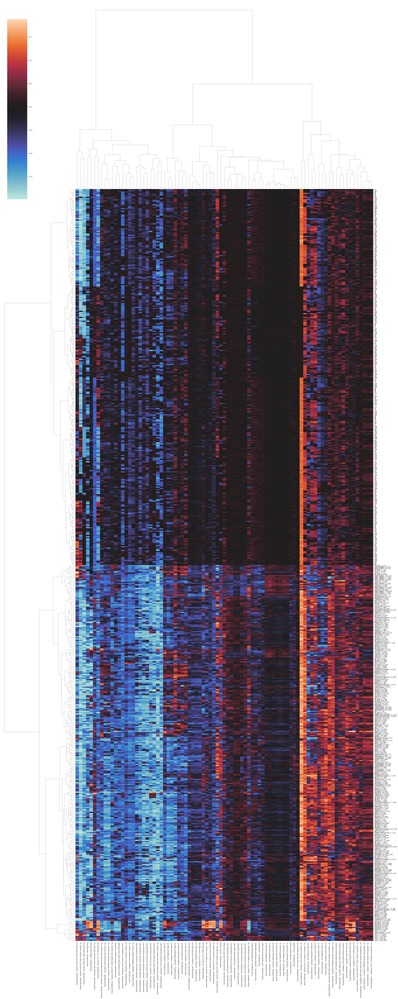

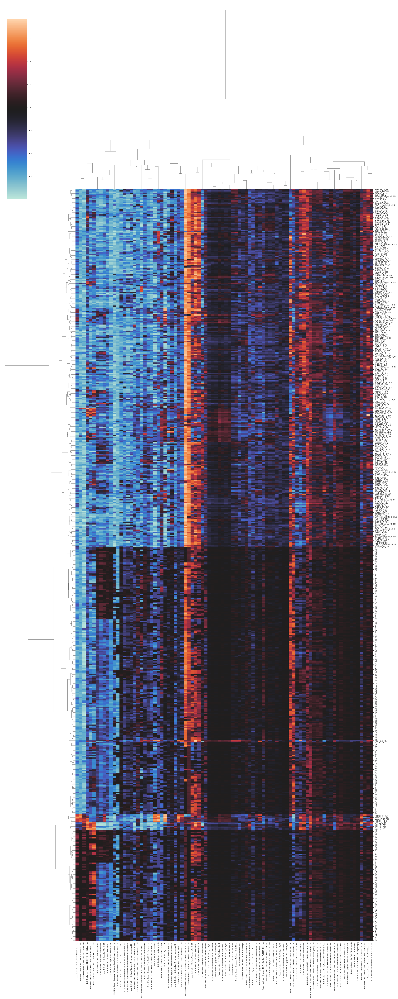

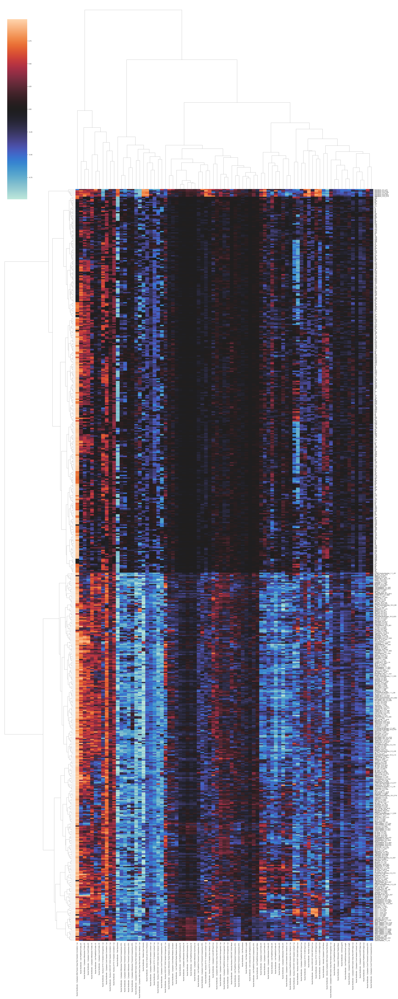

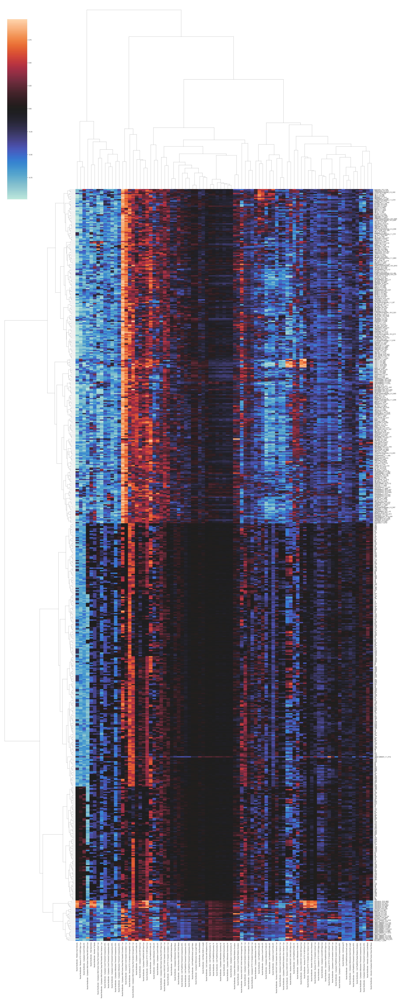

In [150]:
if confirm == '1':
#     my_path = r"C:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E006\Results"
#     my_file = "graph2.pdf"
    bothcombined_cluster_list = []
    for i in range(len(file_path_match)):
        clustering = sns.clustermap(pd.concat([ctrl_drop_both[i],drop_both[i]]), method = 'ward', metric = 'euclidean', cmap="icefire",  xticklabels=1, yticklabels=1, figsize = (40,100))
    bothcombined_cluster_list
 #   break
if confirm == '2':
    corrcombined_cluster_list = []
    for i in range(len(file_path_match)):
        clustering = sns.clustermap(pd.concat([ctrl_drop_corr[i],drop_corr[i]]), method = 'ward', metric = 'euclidean', cmap="icefire",  xticklabels=1, yticklabels=1, figsize = (40,100))
    corrcombined_cluster_list
if confirm == '3':
    varcombined_cluster_list = []
    for i in range(len(file_path_match)):
        clustering = sns.clustermap(pd.concat([ctrl_drop_var[i],drop_var[i]]), method = 'ward', metric = 'euclidean', cmap="icefire",  xticklabels=1, yticklabels=1, figsize = (40,100))
    varcombined_cluster_list

In [170]:
# ask if makes sense to ask about setting correlation for these
where = input("Where would you like the list of mahalanobis distance & their corresponding compounds to be deposited? Please copy the name of that file path and put a \ at the end of it ")
name = input("What would you like it to be called? Please put the name.txt WITHOUT spaces")

# ------- choose number of highest values to pick. cant be larger than number of trt wells. rn is 10

# if yes to both
if confirm == '1':
    both_highestn_list = []
    for i in range(len(file_path_match)):
        tup_list = []
        test10 = np.sort(mahal_list_both[i])
        for j in test10:
            num = mahal_list_both[i].index(j)
            f = drop_both[i].index.values.tolist()[num]
            tup = (j, f)
            tup_list.append(tup)
        both_highestn_list.append(tup_list)
        with open( str(where + name), "a") as o:
            o.write("\nFor plate " + str(i + 1) + " the following compounds and associated distances: \n\n" + str(both_highestn_list[i])+ "\n\n")



# ------- choose number of highest values to pick. cant be larger than number of trt wells. rn is 10

# if yes to first
if confirm == '2':
    corr_highestn_list = []
    for i in range(len(file_path_match)):
        tup_list = []
        test10 = np.sort(mahal_list_corr[i])
        for j in test10:
            num = mahal_list_corr[i].index(j)
            f = drop_corr[i].index.values.tolist()[num]
            tup = (j, f)
            tup_list.append(tup)
        corr_highestn_list.append(tup_list)
    corr_highestn_list

# ------- choose number of highest values to pick. cant be larger than number of trt wells. rn is 10

# if yes to second
if confirm == '3':
    var_highestn_list = []
    for i in range(len(file_path_match)):
        tup_list = []
        test10 = np.sort(mahal_list_var[i])
        for j in test10:
            num = mahal_list_var[i].index(j)
            f = drop_var[i].index.values.tolist()[num]
            tup = (j, f)
            tup_list.append(tup)
        var_highestn_list.append(tup_list)
    var_highestn_list

Where would you like the list of mahalanobis distance & their corresponding compounds to be deposited? Please copy the name of that file path and put a \ at the end of it C:\Users\jrozenblit\Box\Programs\NSP900 - Imaging\900-Biology\invitro\experiments\OM_PLATFORM_E005\Results\
What would you like it to be called? Please put the name.txt WITHOUT spacesmahal_dist_and_compounds.txt


In [1]:
# both_highestn_list[0]

In [103]:
tested = np.sort(mahal_list_both[1])
tested

array([ 9.98071943, 10.33580782, 10.37831377, 10.41798499, 10.43980324,
       10.71769878, 10.83774331, 10.85232235, 10.98615822, 11.0087543 ,
       11.00976146, 11.03207515, 11.03960085, 11.06903853, 11.09486979,
       11.09626784, 11.11913654, 11.1217784 , 11.12877331, 11.15169968,
       11.202153  , 11.26526861, 11.29300074, 11.33640837, 11.34275369,
       11.36875046, 11.41125002, 11.41630802, 11.43525198, 11.47688448,
       11.48359857, 11.48577067, 11.48946864, 11.50052845, 11.51489243,
       11.5280729 , 11.53082345, 11.54201944, 11.55340733, 11.56261376,
       11.57381526, 11.57674334, 11.57902756, 11.58295959, 11.61266843,
       11.61458182, 11.62181635, 11.63641782, 11.6408195 , 11.64235396,
       11.64377629, 11.66642805, 11.66785589, 11.69111131, 11.69673682,
       11.70811972, 11.71513283, 11.72392592, 11.74619002, 11.77760295,
       11.78301392, 11.79274395, 11.79550629, 11.79581188, 11.82084857,
       11.82523723, 11.84282229, 11.84843512, 11.84929513, 11.86

In [104]:
def pvalue_mahal(mu, sigma, samp_size, samp_mean=0, deltam=0):
    np.random.seed(1234)
    s1 = np.random.normal(mu, sigma, samp_size)
    if samp_mean > 0:
        print(len(s1[s1>samp_mean]))
        outliers = float(len(s1[s1>samp_mean])*100)/float(len(s1))
        print('Percentage of numbers larger than {} is {}%'.format(samp_mean, outliers))
    if deltam == 0:
        deltam = abs(mu-samp_mean)
    if deltam > 0 :
        outliers = (float(len(s1[s1>(mu+deltam)]))
                    +float(len(s1[s1<(mu-deltam)])))*100.0/float(len(s1))
        print('Percentage of numbers further than the population mean of {} by +/-{} is {}%'.format(mu, deltam, outliers))

    fig, ax = plt.subplots(figsize=(8,8))
    fig.suptitle('Normal Distribution: population_mean={}'.format(mu) )
    plt.hist(s1)
    plt.axvline(x=mu+deltam, color='red')
    plt.axvline(x=mu-deltam, color='green')
    plt.show()

159
Percentage of numbers larger than 12.506128089301725 is 53.535353535353536%
Percentage of numbers further than the population mean of 12.482171556143669 by +/-0.02395653315805646 is 97.64309764309765%


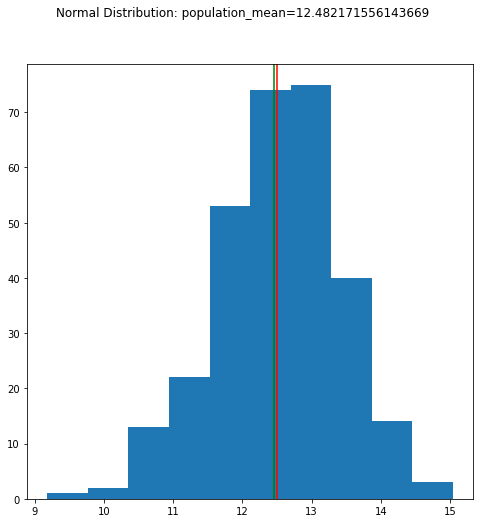

In [106]:
pvalue_mahal(np.mean(mahal_list_both[1]), np.std(mahal_list_both[1]), len(mahal_list_both[1]), mahal_list_both[1][292])

In [107]:
kde = stats.gaussian_kde(mahal_list_both[0]) # returns callable function that can be eval with any x
x = np.linspace(np.array(mahal_list_both[0]).min(), np.array(mahal_list_both[0]).max(), 100) #ks density in matlab equiv choice of x
p = kde(x) #evaluates 
1- p # p is the probability at the point in a distribution 

array([0.9781644 , 0.97450984, 0.97055408, 0.96627777, 0.96164576,
       0.95660649, 0.95109329, 0.94502754, 0.93832312, 0.93089167,
       0.92264821, 0.91351649, 0.90343408, 0.89235684, 0.88026293,
       0.86715618, 0.85306874, 0.83806261, 0.82222964, 0.80568967,
       0.78858642, 0.77108176, 0.75334886, 0.73556579, 0.71791076,
       0.70056017, 0.68368952, 0.66747612, 0.65210164, 0.63775174,
       0.62461073, 0.6128501 , 0.60261233, 0.59399272, 0.58702393,
       0.58166801, 0.5778195 , 0.57532109, 0.57399046, 0.5736541 ,
       0.57418219, 0.57551759, 0.57769301, 0.58083209, 0.58513283,
       0.59083521, 0.59817768, 0.60734955, 0.61844739, 0.63144306,
       0.64616902, 0.66232333, 0.67949325, 0.69719282, 0.7149081 ,
       0.7321427 , 0.7484578 , 0.76350237, 0.77703205, 0.78891695,
       0.79913989, 0.80778704, 0.81503276, 0.82111986, 0.82633665,
       0.83099209, 0.83539068, 0.83980944, 0.84447905, 0.84957126,
       0.85519361, 0.86139128, 0.8681551 , 0.87543329, 0.88314

In [108]:
ctrl_mahal_array = np.array(ctrl_mahal_list_both[0])
trt_mahal_array = np.array(mahal_list_both[0])
VecValues= np.concatenate((ctrl_mahal_array,trt_mahal_array))[:,None]
VecValues

array([[ 9.83041205],
       [ 8.89636657],
       [ 9.33373918],
       [ 9.35624399],
       [ 9.69551365],
       [ 9.20664649],
       [ 9.04034626],
       [ 9.86929557],
       [ 8.75863744],
       [ 9.89915511],
       [10.07100003],
       [ 8.6626973 ],
       [ 9.15487668],
       [ 8.8548135 ],
       [ 9.47324759],
       [ 8.98093762],
       [ 8.92535049],
       [ 8.44330617],
       [ 9.57123824],
       [ 8.1854991 ],
       [ 8.53542257],
       [ 9.63550563],
       [ 8.79006197],
       [ 9.15835851],
       [ 8.69004316],
       [ 9.84488845],
       [ 9.5326145 ],
       [ 9.13032062],
       [ 9.14451343],
       [ 9.31167848],
       [ 8.42761954],
       [10.27033202],
       [ 9.41867157],
       [ 8.83430572],
       [ 9.49432187],
       [ 9.86829727],
       [ 9.45568223],
       [ 8.39092825],
       [11.17711444],
       [ 9.07403671],
       [ 8.81608892],
       [ 8.99997469],
       [10.30310269],
       [ 9.42405726],
       [ 8.7254499 ],
       [ 9

In [111]:
# from sklearn.neighbors import KernelDensity

# np.random.seed(12345)
# # # similar to MATLAB ksdensity example x = [randn(30,1); 5+randn(30,1)] and [f,xi] = ksdensity(x)
# # # matlab function returns a prob dens estimate f for sample data x in the vector
# # # estimate is based on a normal kernel function, and is evaluated at equally spaced points xi that cover range of data in x
# # # ks density eestimates the density at 100 points for univariate data, 900 for bivariate
trt_mahal_array = np.array(mahal_list_both[0])
trt_mahal_max = np.max(trt_mahal_array)
trt_mahal_min = np.min(trt_mahal_array)
print(trt_mahal_min)
trt_mahal_min = np.min(trt_mahal_array)

Vecpoints=np.linspace(trt_mahal_min,trt_mahal_max,100)

9.302141108744872


In [112]:
from sklearn.neighbors import KernelDensity
from scipy.stats import gaussian_kde
from statsmodels.nonparametric.kde import KDEUnivariate
from statsmodels.nonparametric.kernel_density import KDEMultivariate


def kde_scipy(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scipy"""
    # Note that scipy weights its bandwidth by the covariance of the
    # input data.  To make the results comparable to the other methods,
    # we divide the bandwidth by the sample standard deviation here.
    kde = gaussian_kde(x, bw_method=bandwidth / x.std(ddof=1), **kwargs)
    return kde.evaluate(x_grid)

In [113]:
kde = kde_scipy(np.array(mahal_list_both[0]), Vecpoints, bandwidth = .2)
get_pval = 1-kde
print(kde)
get_pval

[0.019681   0.02362814 0.02761346 0.03159595 0.03560492 0.03973924
 0.04415352 0.04903452 0.05457377 0.06094353 0.06828287 0.0766955
 0.08625587 0.09701622 0.10901013 0.12225369 0.13674862 0.15248744
 0.16945133 0.18758692 0.20675812 0.22669228 0.24696036 0.26702961
 0.28639521 0.30474715 0.32208947 0.33872988 0.355109   0.37151992
 0.38784007 0.40341514 0.41717954 0.42798934 0.4350351  0.43815388
 0.43790255 0.43536993 0.43182929 0.42839614 0.42582393 0.42446853
 0.42434813 0.42518777 0.42638917 0.42696712 0.42556796 0.42067277
 0.41098439 0.3958669  0.37563629 0.35154642 0.32545575 0.29931488
 0.27469368 0.25252814 0.23314445 0.21648513 0.20238756 0.19077397
 0.18168317 0.17516364 0.17111112 0.16914815 0.16860972 0.16864109
 0.16836281 0.16703671 0.16417944 0.1596025  0.15338801 0.14582316
 0.13731435 0.12829382 0.1191298  0.11005588 0.10113994 0.09230671
 0.08340997 0.07432954 0.06505747 0.05574333 0.04668543 0.03827371
 0.03090388 0.02488855 0.02039146 0.01740354 0.01576645 0.01523

array([0.980319  , 0.97637186, 0.97238654, 0.96840405, 0.96439508,
       0.96026076, 0.95584648, 0.95096548, 0.94542623, 0.93905647,
       0.93171713, 0.9233045 , 0.91374413, 0.90298378, 0.89098987,
       0.87774631, 0.86325138, 0.84751256, 0.83054867, 0.81241308,
       0.79324188, 0.77330772, 0.75303964, 0.73297039, 0.71360479,
       0.69525285, 0.67791053, 0.66127012, 0.644891  , 0.62848008,
       0.61215993, 0.59658486, 0.58282046, 0.57201066, 0.5649649 ,
       0.56184612, 0.56209745, 0.56463007, 0.56817071, 0.57160386,
       0.57417607, 0.57553147, 0.57565187, 0.57481223, 0.57361083,
       0.57303288, 0.57443204, 0.57932723, 0.58901561, 0.6041331 ,
       0.62436371, 0.64845358, 0.67454425, 0.70068512, 0.72530632,
       0.74747186, 0.76685555, 0.78351487, 0.79761244, 0.80922603,
       0.81831683, 0.82483636, 0.82888888, 0.83085185, 0.83139028,
       0.83135891, 0.83163719, 0.83296329, 0.83582056, 0.8403975 ,
       0.84661199, 0.85417684, 0.86268565, 0.87170618, 0.88087

In [114]:
vp_ctrl = np.linspace(np.min(np.array(ctrl_mahal_list_both[0])), np.max(np.array(ctrl_mahal_list_both[0])), 100)
kde = kde_scipy(np.array(ctrl_mahal_list_both[0]), vp_ctrl, bandwidth = .2)
get_pval = 1-kde
print(kde)
get_pval

[0.01671249 0.01939774 0.02231815 0.02551502 0.0290497  0.03300769
 0.03750362 0.04268588 0.04873863 0.05587783 0.06433816 0.07434921
 0.08610172 0.09970806 0.11516441 0.13232353 0.15088722 0.17042438
 0.19041592 0.21032201 0.22966112 0.24808727 0.26545039 0.2818273
 0.29751551 0.31298839 0.32881755 0.34557421 0.36372601 0.38354737
 0.40506013 0.42801554 0.4519211  0.47610583 0.49980967 0.52227748
 0.54283941 0.56096442 0.57628355 0.58858772 0.59781099 0.60401049
 0.60734971 0.6080853  0.60655218 0.60313965 0.59825474 0.59227493
 0.58549907 0.57810864 0.57015036 0.56154544 0.55212355 0.54167227
 0.52999006 0.51693081 0.50243252 0.48652744 0.46933614 0.45105042
 0.43191116 0.4121859  0.39214959 0.37206962 0.35219471 0.33274589
 0.31390742 0.2958161  0.27854915 0.26211285 0.24643604 0.23137296
 0.2167189  0.20223879 0.18770517 0.17293895 0.15784448 0.14243165
 0.12682038 0.11122728 0.09593749 0.08126803 0.06752934 0.05499137
 0.04385858 0.03425599 0.02622636 0.01973663 0.01469102 0.01094

array([0.98328751, 0.98060226, 0.97768185, 0.97448498, 0.9709503 ,
       0.96699231, 0.96249638, 0.95731412, 0.95126137, 0.94412217,
       0.93566184, 0.92565079, 0.91389828, 0.90029194, 0.88483559,
       0.86767647, 0.84911278, 0.82957562, 0.80958408, 0.78967799,
       0.77033888, 0.75191273, 0.73454961, 0.7181727 , 0.70248449,
       0.68701161, 0.67118245, 0.65442579, 0.63627399, 0.61645263,
       0.59493987, 0.57198446, 0.5480789 , 0.52389417, 0.50019033,
       0.47772252, 0.45716059, 0.43903558, 0.42371645, 0.41141228,
       0.40218901, 0.39598951, 0.39265029, 0.3919147 , 0.39344782,
       0.39686035, 0.40174526, 0.40772507, 0.41450093, 0.42189136,
       0.42984964, 0.43845456, 0.44787645, 0.45832773, 0.47000994,
       0.48306919, 0.49756748, 0.51347256, 0.53066386, 0.54894958,
       0.56808884, 0.5878141 , 0.60785041, 0.62793038, 0.64780529,
       0.66725411, 0.68609258, 0.7041839 , 0.72145085, 0.73788715,
       0.75356396, 0.76862704, 0.7832811 , 0.79776121, 0.81229

In [118]:
def f_test(x, y):
    x = np.array(x)
    y = np.array(y)
    f = np.var(x, ddof=1)/np.var(y, ddof=1) #calculate F test statistic 
    dfn = x.size-1 #define degrees of freedom numerator 
    dfd = y.size-1 #define degrees of freedom denominator 
    p = 1-scipy.stats.f.cdf(f, dfn, dfd) #find p-value of F test statistic 
    return f, p

In [132]:
zscores = stats.zscore(mahal_list_both[1])
pval_list = []
for i in range(len(zscores)):
    p_value = scipy.stats.norm.sf(abs(i))
    pval_list.append(p_value)
pval_list

[0.5,
 0.15865525393145707,
 0.022750131948179195,
 0.0013498980316300933,
 3.167124183311986e-05,
 2.866515718791933e-07,
 9.865876450376946e-10,
 1.279812543885835e-12,
 6.22096057427174e-16,
 1.1285884059538324e-19,
 7.61985302416047e-24,
 1.910659574498663e-28,
 1.776482112077653e-33,
 6.117164399549704e-39,
 7.7935368191928e-45,
 3.6709661993126986e-51,
 6.388754400537906e-58,
 4.105996202098791e-65,
 9.740948918936876e-73,
 8.527223952630975e-81,
 2.7536241186061556e-89,
 3.2792780189789425e-98,
 1.4398924351450382e-107,
 2.3306370062206495e-117,
 1.390392118549624e-127,
 3.056696706382561e-138,
 2.476063315503107e-149,
 7.389481006884598e-161,
 8.123869469659426e-173,
 3.2897852667040066e-185,
 4.906713927147908e-198,
 2.6952500812001938e-211,
 5.452080603511774e-225,
 4.061185620915855e-239,
 1.1138987855742525e-253,
 1.1249107064724061e-268,
 4.182624065796808e-284,
 5.7255712225239266e-300,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0

In [ ]:
# ------------------------ QC
plate_cellwell_count = []
for i in range(len(file_path_match)):
    count = main_df_list[i]['location'].value_counts()
    plate_cellwell_count.append(count)
    print("\nThis is the cell - well count for plate " + str(i + 1) +':\n\n', plate_cellwell_count[i])